In [1]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import json
import math
from pymop.factory import get_problem, get_uniform_weights
%matplotlib notebook

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d  

In [2]:
ws = [[0.1666, 0.6666, 0.1666],
           [0.8,0.1,0.1],  
           [0.1,0.8,.1], 
           [0.1, 0.1, 0.8],
           [0.2, 0., 0.8], 
           [0.2, 0.8, 0.],
           [0.8, 0.2, 0.0],
           [0.333, 0.333, 0.333], 
           [0.25, 0.25, 0.5], 
           [0.25, 0.5, 0.25], 
           [0.5, 0.25, 0.25],
           [0.5,0.5,0.], 
           [0,0.5,0.5], 
           [0.5,0,0.5], 
           [0.2,0.2,0.6], 
           [0.2, 0.6, 0.2], 
           [0.6, 0.2, 0.2], 
           [0.4, 0.3, 0.3], 
           [0.3, 0.4, 0.3],           
           [0.3, 0.3, 0.4]]

def data_from_json(name):
    data = []
    #Each line in the json is an evolutionary run
    with open(name, 'r') as fp:

        for levels_json in fp:
            if levels_json != "\n":
                di = json.loads(levels_json)
                data.append(di)
    return data

def plot_mat_3d(mats, title, sup_title):
    fig = plt.figure()
    fig.suptitle(sup_title, fontsize=16)
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title(title)
    for mat in mats:
        xs = mat[:, 0]

        ys = mat[:, 1]

        zs = mat[:, 2]

        ax.scatter(xs,ys,zs)

    plt.show()
    
def plot_mat_2d_lines(mats, title, sup_title):
    plt.rcParams["figure.figsize"] = [7.50, 3.50]
    plt.rcParams["figure.autolayout"] = True
    fig = plt.figure()
    fig.suptitle(sup_title, fontsize=16)
    ax = fig.add_subplot(111)
    ax.set_title(title)
    for j in range(len(mats[1])):
        x = [0, 2*mats[1][j, 0]]
        y = [0, 2*mats[1][j, 1]]
        #ax.scatter(x,y,z)
        ax.plot(x, y, color='red')

    for mat in mats:


        xs = mat[:, 0]

        ys = mat[:, 1]


        ax.scatter(xs,ys, s=10)
    plt.show()
    
def plot_mat_2d(mats, title, sup_title, labels = []):
    # plt.rcParams["figure.figsize"] = [7.50, 3.50]
    # plt.rcParams["figure.autolayout"] = True
    fig = plt.figure()
    fig.suptitle(sup_title, fontsize=16)
    ax = fig.add_subplot(111)
    ax.set_title(title)

    for i, mat in enumerate(mats):
        if len(labels) != 0 and mat.shape[0] == 1:
            ax.scatter(mat[:,0], mat[:,1])
            ax.annotate(labels[i], (mat[:,0], mat[:,1]))
        elif len(labels) != 0:
            xs = mat[:, 0]
            ys = mat[:, 1]
            ax.scatter(xs, ys, label = labels[i] )

        else:
            xs = mat[:, 0]
            ys = mat[:, 1]
            ax.scatter(xs, ys)

    ax.legend()
    plt.show()

In [3]:
ref_dirs = get_uniform_weights(100, 3)
dtlz1_pf = get_problem("dtlz1", n_var=12, n_obj=3).pareto_front(ref_dirs)
dtlz2_pf = get_problem("dtlz2", n_var=12, n_obj=3).pareto_front(ref_dirs)
dtlz1 = get_problem("dtlz1", n_var=12, n_obj=3)
dtlz2 = get_problem("dtlz2", n_var=12, n_obj=3)

## Implementación de NSGAIII y NSGAII

La implementación de NSGAII se basó en lo visto en lo presentado en las clases, mientras que la implementación de NSGAIII se realizó con base en las descripciones dadas en [An Evolutionary Many-Objective Optimization Algorithm Using Reference-point Based Non-dominated Sorting Approach, Part I: Solving Problems with Box Constraints](https://www.egr.msu.edu/~kdeb/papers/k2012009.pdf) y [Investigating the Normalization Procedure of NSGA-III](https://www.researchgate.net/publication/330835251_Investigating_the_Normalization_Procedure_of_NSGA-III_10th_International_Conference_EMO_2019_East_Lansing_MI_USA_March_10-13_2019_Proceedings). Particularmente, se utilizó el proceso de normalización de las funciones objetivo con base en el segundo artículo y el resto del algoritmo se tomó del primero. Se tomó la estructura de clases definida para los problemas y funciones de evaluación capaz de hacer la evaluación independiente de la codificación, la cruza SBX y mutación polinomial para codificación real implementada en la tarea anterior, y la selección por torneo para el NSGAII.

## Parámetros

Se realizaron 40 corridas en total, 20 correspondientes a 400 generaciones para DTLZ1 y DTLZ2 y otras 20 correspondientes a 1000 generaciones para DTLZ1 y 250 para DTLZ2.

Las 20 corridas se descomponen en 5 por algoritmo con cada de uno de los dos problemas multiobjetivo, con 3 objetivos, DTLZ1 y DTLZ2.

Para todas las corridas se manejaron los siguientes parámetros:

$$p_c = 1$$
$$p_m = \frac{1}{12}$$
Para la cruza SBX:
$$n_c = 30$$
Para la mutación polinomial
$$n_m = 20$$

## Resultados de cada corrida


### Con generaciones máximas de $MaxGens_{dtlz1} = 400$ y $MaxGens_{dtlz2} = 400$
$MaxGens_{dtlz1} = 400$ es el número de generaciones con el que se realizó la optimización en el [primer](https://www.egr.msu.edu/~kdeb/papers/k2012009.pdf) artículo.

<IPython.core.display.Javascript object>


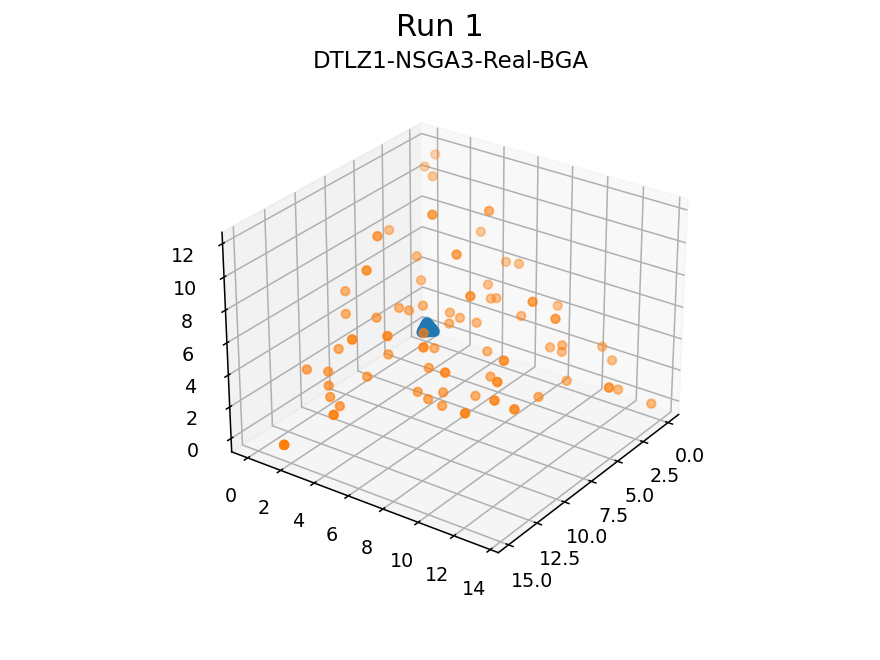

<IPython.core.display.Javascript object>


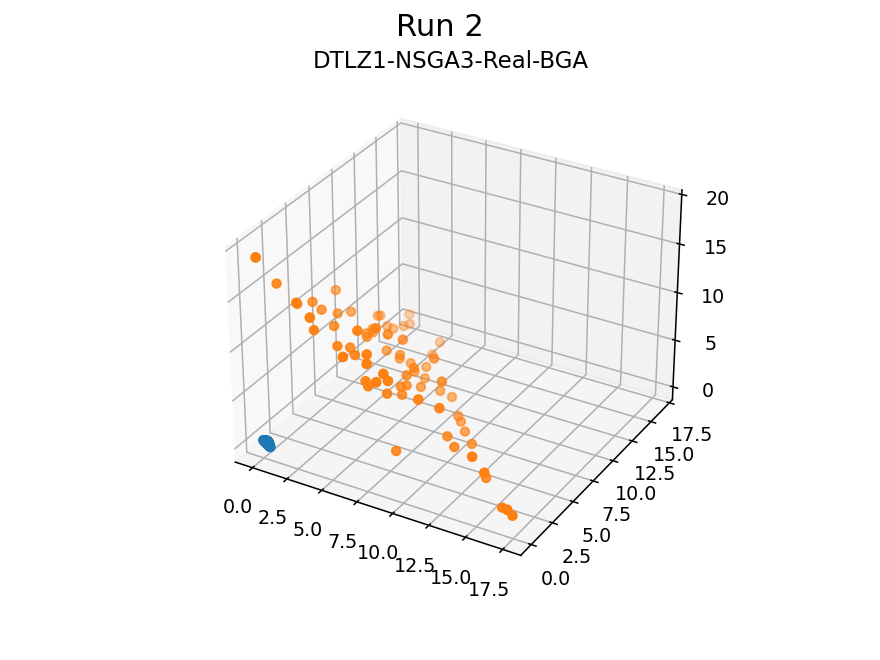

<IPython.core.display.Javascript object>


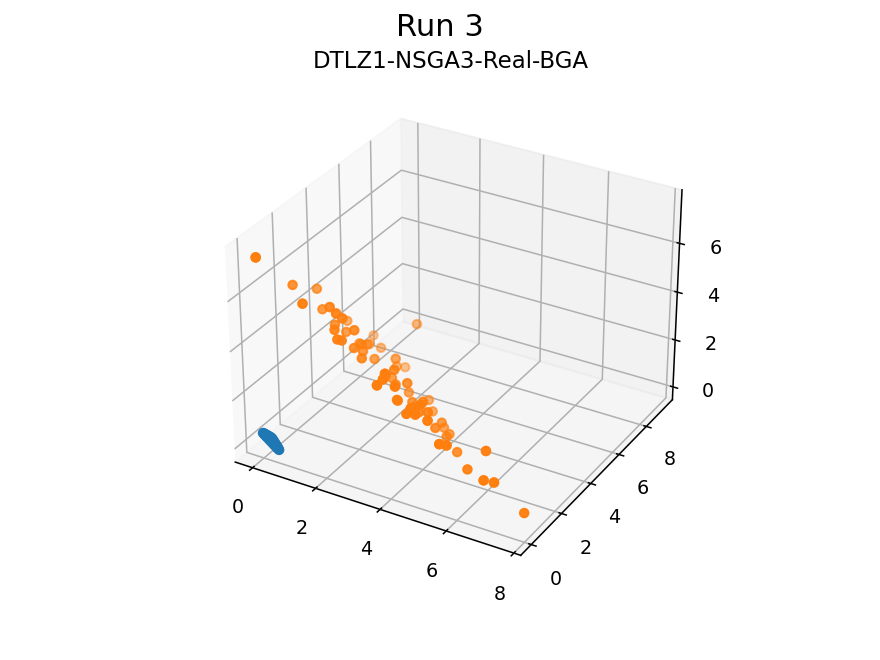

<IPython.core.display.Javascript object>


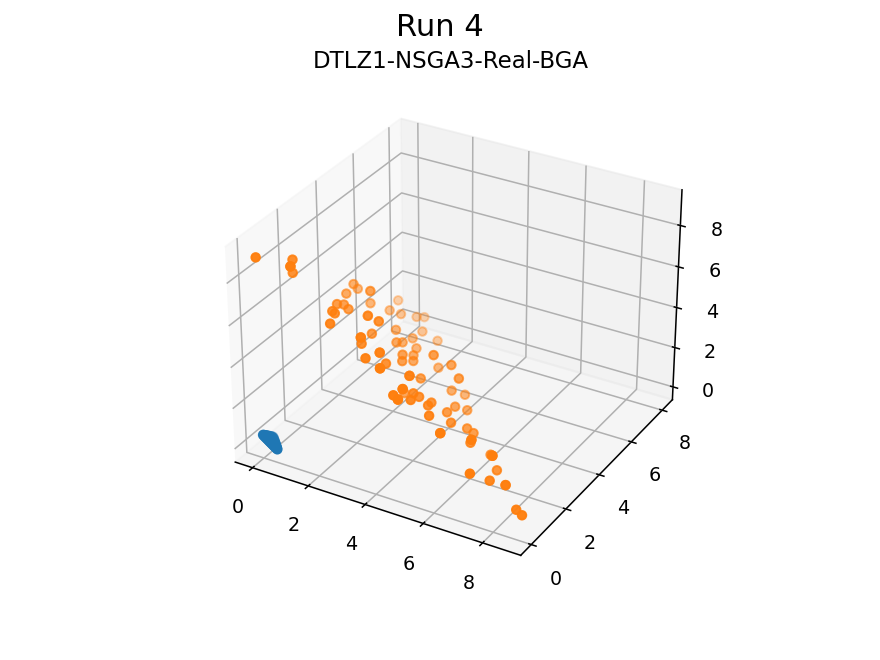

<IPython.core.display.Javascript object>


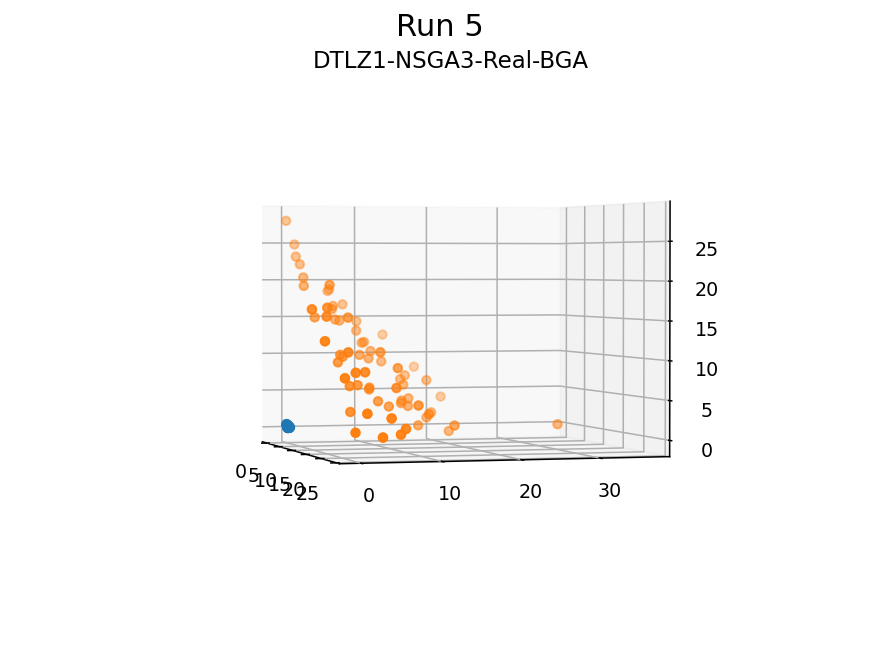

In [4]:
for i, data in enumerate(data_from_json('analytics.json')):

    for k, v in data.items():
        if "DTLZ1" in k:
            mat = np.array(v["phenotypes"])
            plot_mat_3d([dtlz1_pf, dtlz1.evaluate(mat)], k, f"Run {i + 1}")
        elif "DTLZ2" in k:
            mat = np.array(v["phenotypes"])
            plot_mat_3d([dtlz2_pf, dtlz2.evaluate(mat)], k, f"Run {i + 1}")

Como se puede ver, tanto NSGAII como NSGAIII obtuvieron buenos resultados con DTLZ2 pero pobres resultados con DTLZ1.
De manera visual, para DTLZ2 parece ser que NSGAIII en general logra tener una mejor distribución, extensión, y convergencia que NSGAII, para confirmar esto se tendrían que realizar las mediciones pertinentes, sin embargo van más allá del alcance de esta tarea. En cuanto a DTLZ1, de igual forma: de manera visual, NSGAII parece tener una mejor convergencia al acercarse más al frente de Pareto, además de una mejor extensión y distribución.

## Los mejores resultados de cada algoritmo, en cada problema, en todas las corridas
Para poder examinar los resultados de mejor manera, en especial los obtenidos con DTLZ1 se tendría que hacer un "zoom". Esto se realizará dando un órden simple con la norma vectorial de las soluciones de todas las corridas en cada algoritmo con cada problema.

In [133]:
#Concatenamos los resultados de todas las corridas para cada algoritmo
data_json = data_from_json('analytics copy.json')
#best_results = {"DTLZ1-NSGA2" : np.array(data_json[0]["DTLZ1-NSGA2"]["evaluations"]), "DTLZ1-NSGA3" : np.array(data_json[0]["DTLZ1-NSGA3"]["evaluations"]), "DTLZ2-NSGA2" : np.array(data_json[0]["DTLZ2-NSGA2"]["evaluations"]), "DTLZ2-NSGA3" : np.array(data_json[0]["DTLZ2-NSGA3"]["evaluations"])}
best_results = {"DTLZ1-NSGA3" : np.array(data_json[0]["DTLZ1-NSGA3"]["phenotypes"])}
for i, data in enumerate(data_json[1:]):
    data.pop("DTLZ1-NSGA2")
    data.pop("DTLZ2-NSGA2")
    data.pop("DTLZ2-NSGA3")
    for k, v in data.items():
        best_results[k] = np.concatenate((best_results[k], np.array(v["phenotypes"])), axis = 0)

In [134]:
#Ordenamos respecto a la norma de cada punto
for k in best_results.keys():
    li = list(best_results[k])
    li.sort(key = lambda x : np.linalg.norm(x, 2))
    #Extraemos el percentil 80 de cada valor del diccionario
    n = len(li)
    p = math.floor(n*.2)
    best_results[k] = np.array(li)[0 : p + 1,:]

<IPython.core.display.Javascript object>


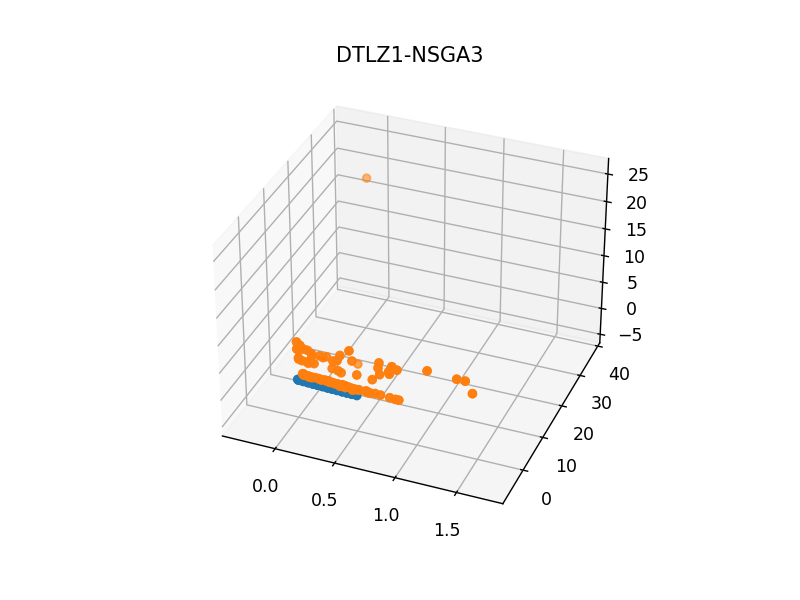

In [135]:
for k, v in best_results.items():
    if "DTLZ1" in k:
        plot_mat_3d([dtlz1_pf, dtlz1.evaluate(v)], k, "")
    elif "DTLZ2" in k:
        plot_mat_3d([dtlz2_pf, dtlz2.evaluate(v)], k, "")

### Con generaciones máximas de $MaxGens_{dtlz1} = 1000$ y $MaxGens_{dtlz2} = 250$
Se intenta optimizar DTLZ1 con un número mayor de generaciones para probar si esto mejora la calidad de los resultados. A su vez se realiza la optimización de DTLZ1 con el número de generaciones utilizadas en el [primer](https://www.egr.msu.edu/~kdeb/papers/k2012009.pdf) artículo.

<IPython.core.display.Javascript object>


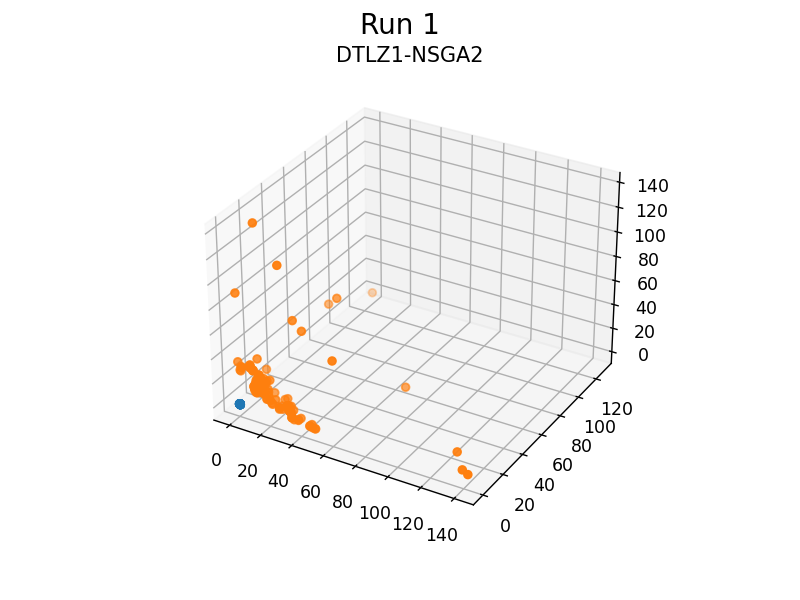

<IPython.core.display.Javascript object>


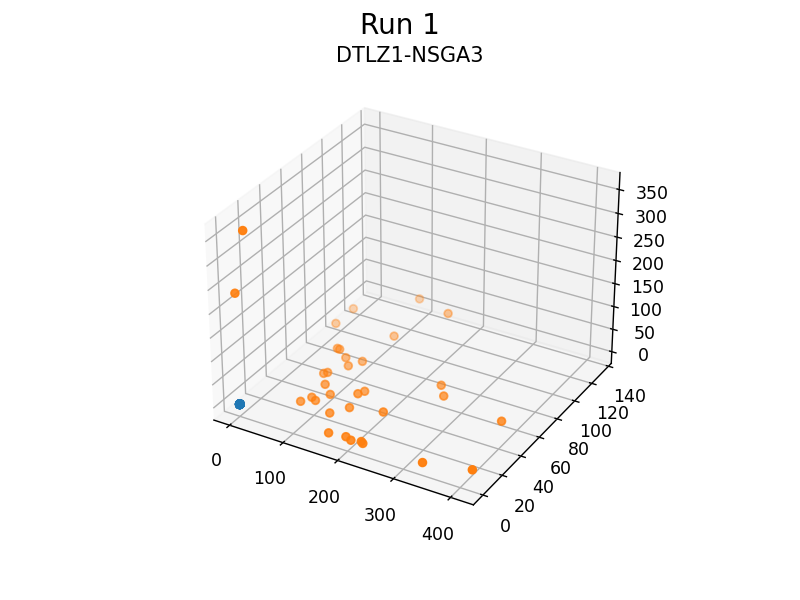

<IPython.core.display.Javascript object>


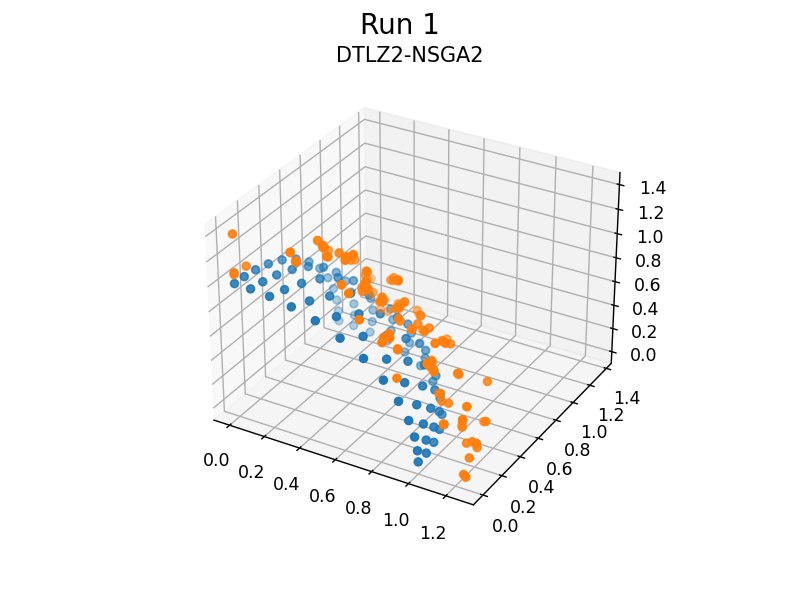

<IPython.core.display.Javascript object>


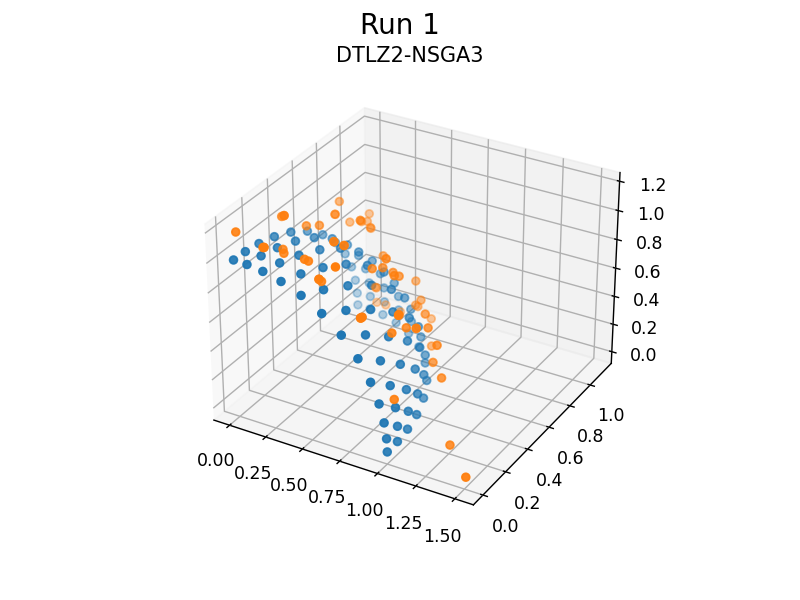

<IPython.core.display.Javascript object>


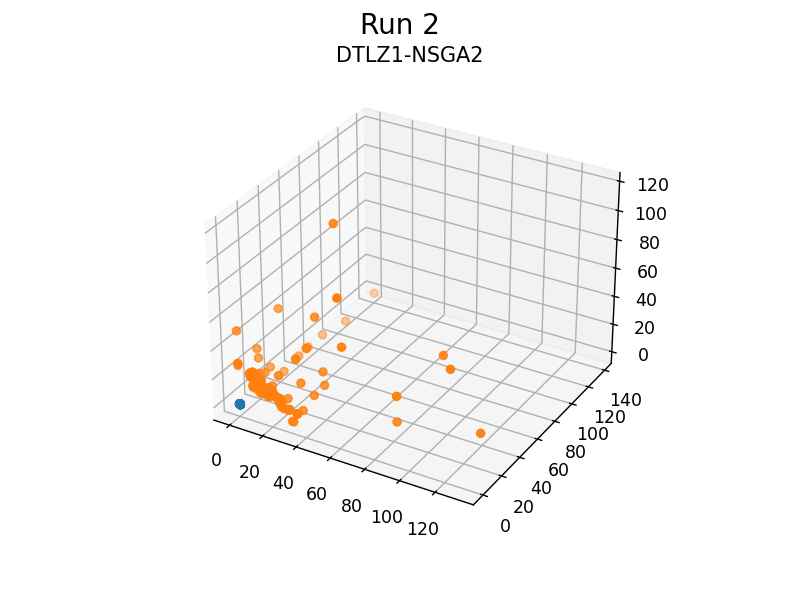

<IPython.core.display.Javascript object>


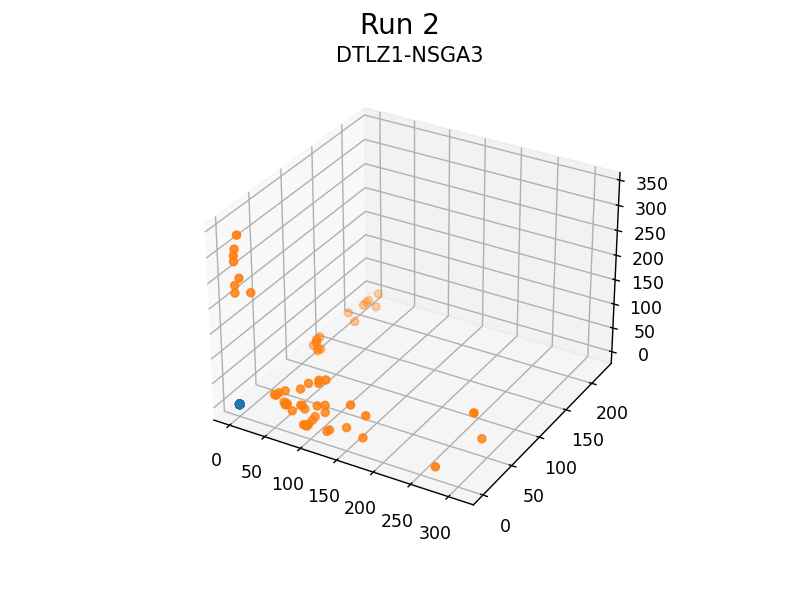

<IPython.core.display.Javascript object>


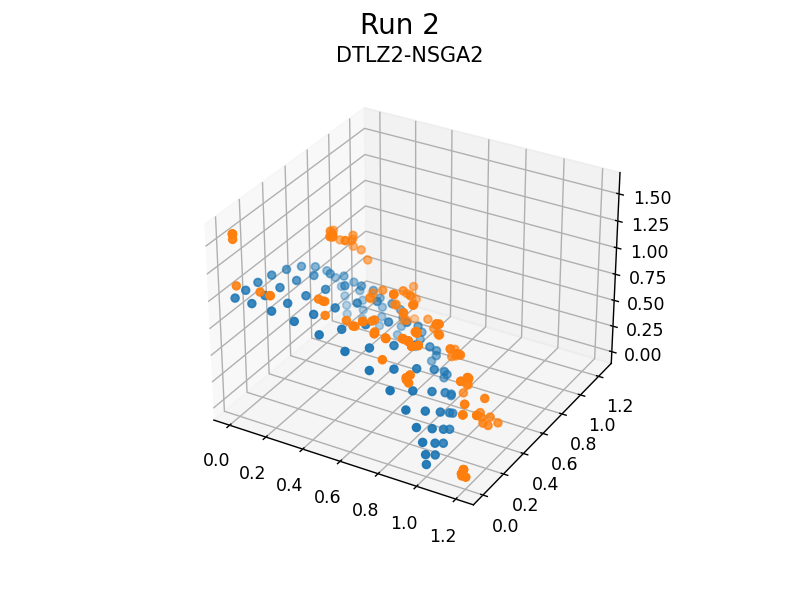

<IPython.core.display.Javascript object>


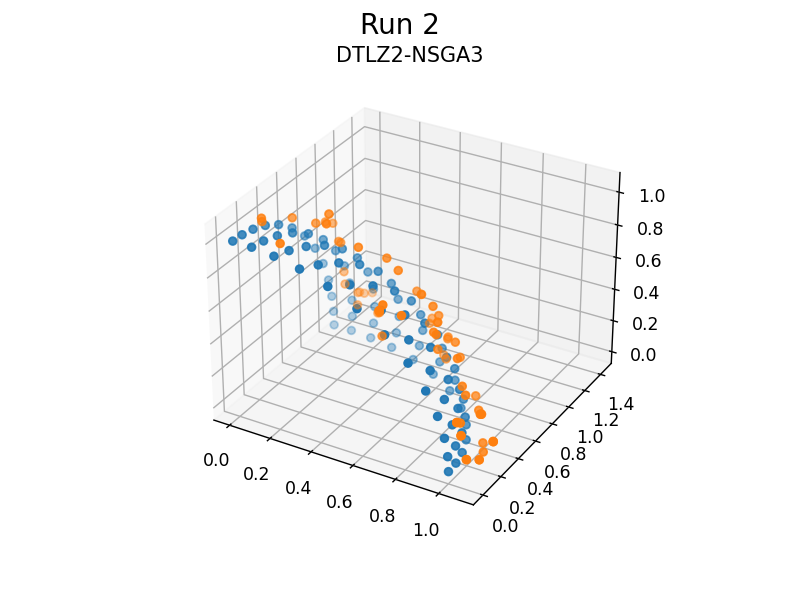

<IPython.core.display.Javascript object>


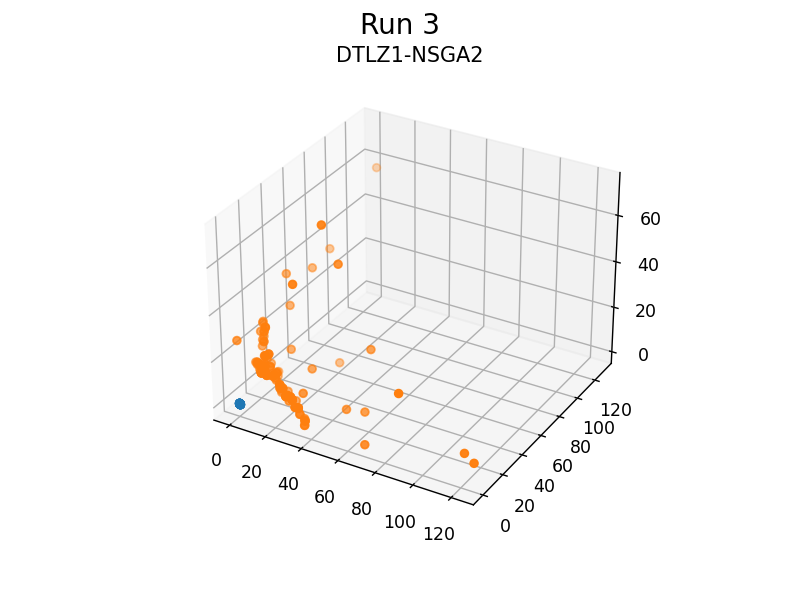

<IPython.core.display.Javascript object>


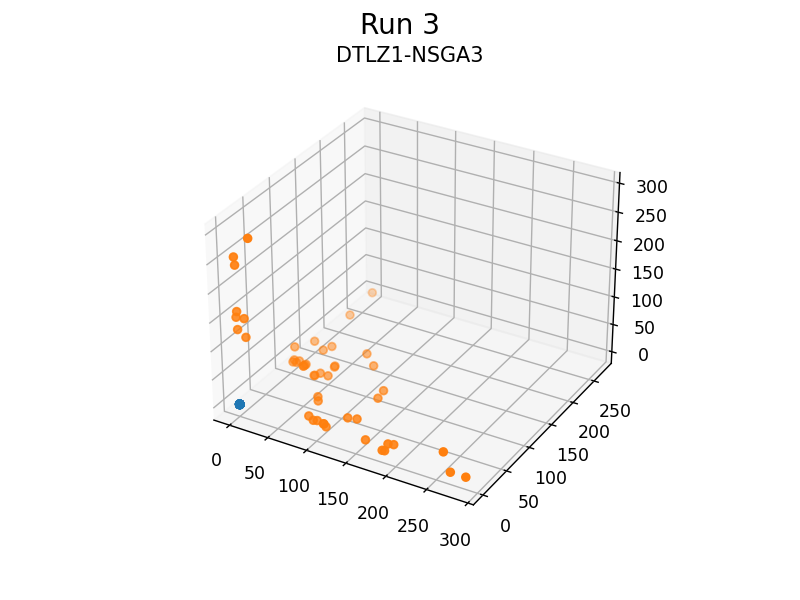

<IPython.core.display.Javascript object>


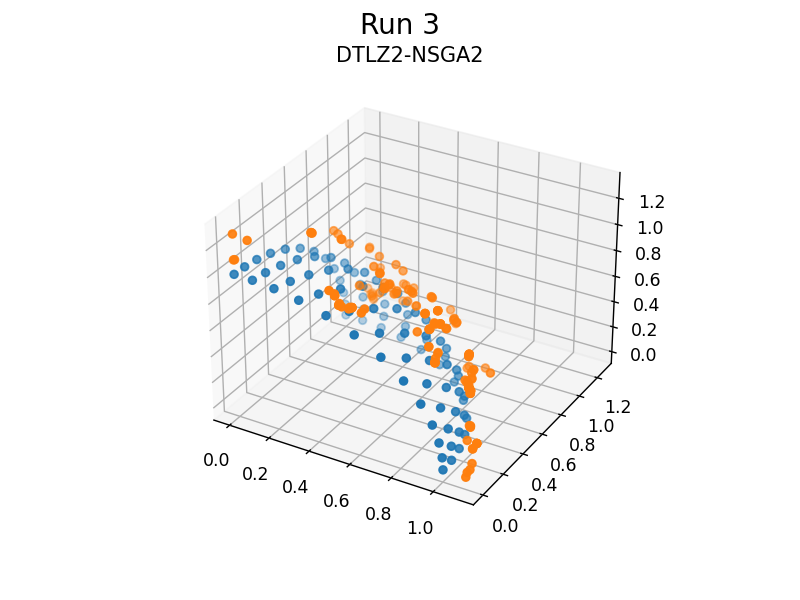

<ipython-input-120-f3e08f621dc9>:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()


<IPython.core.display.Javascript object>


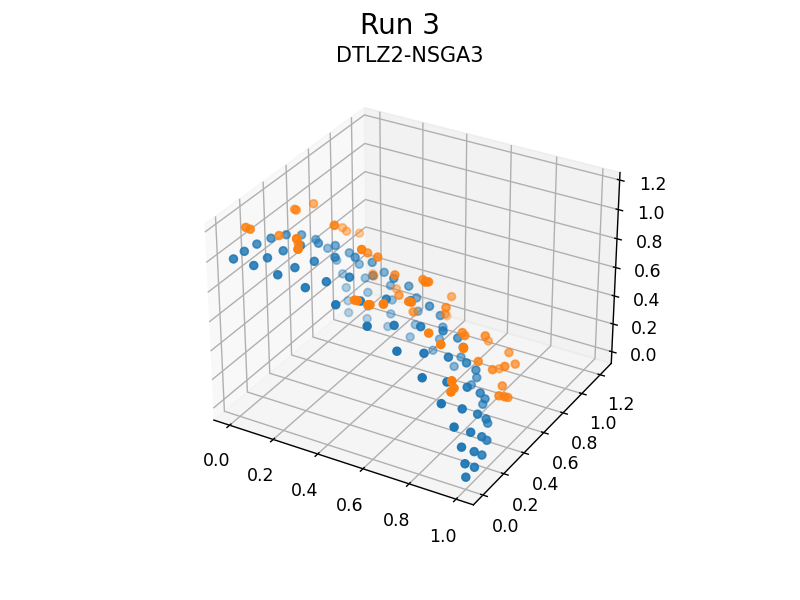

<IPython.core.display.Javascript object>


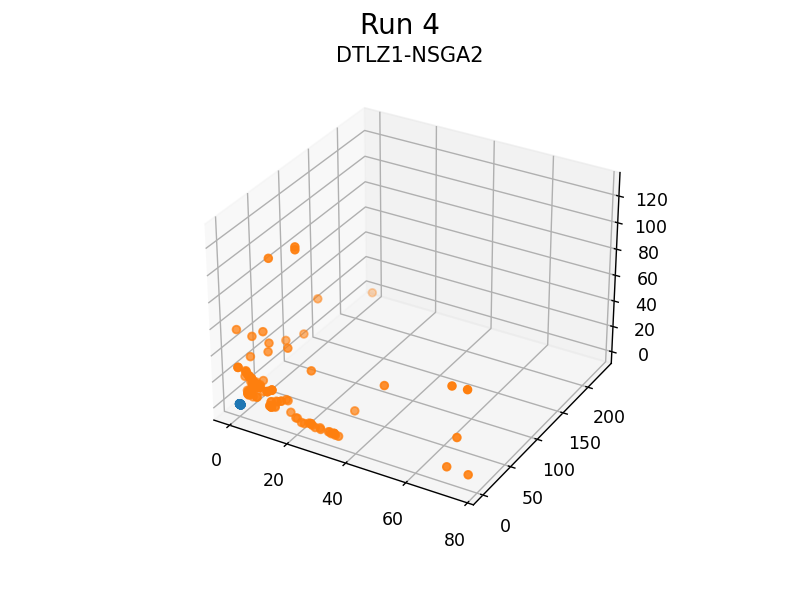

<IPython.core.display.Javascript object>


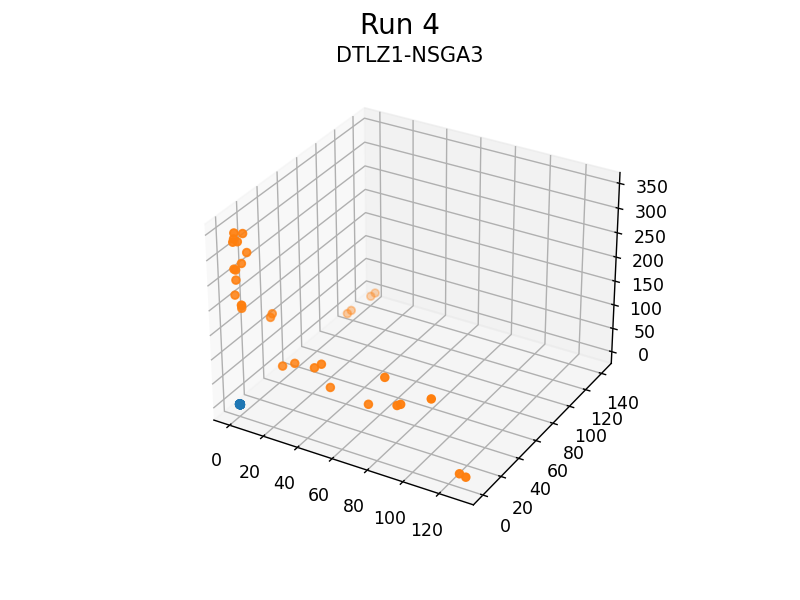

<IPython.core.display.Javascript object>


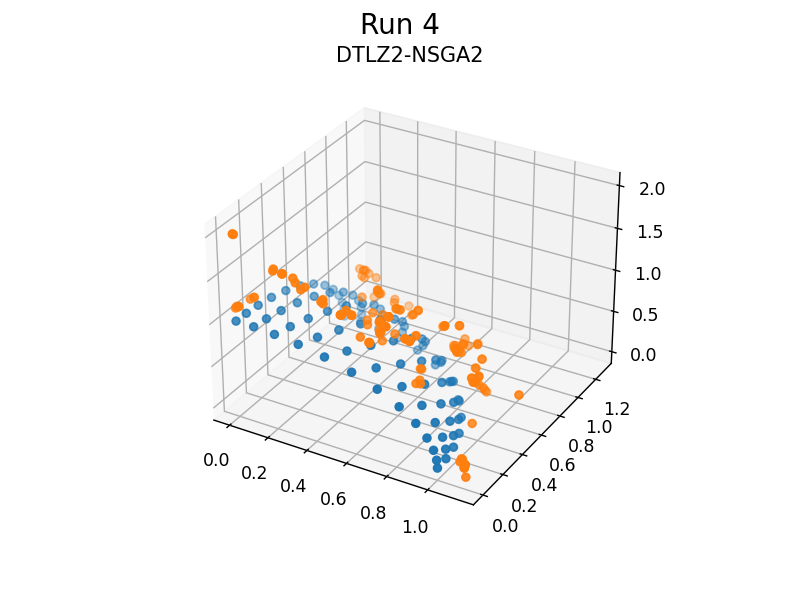

<IPython.core.display.Javascript object>


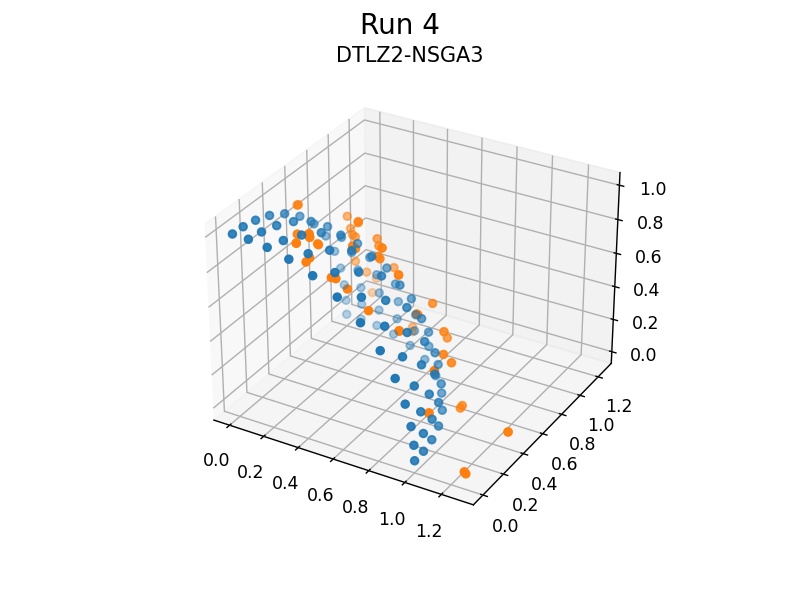

<IPython.core.display.Javascript object>


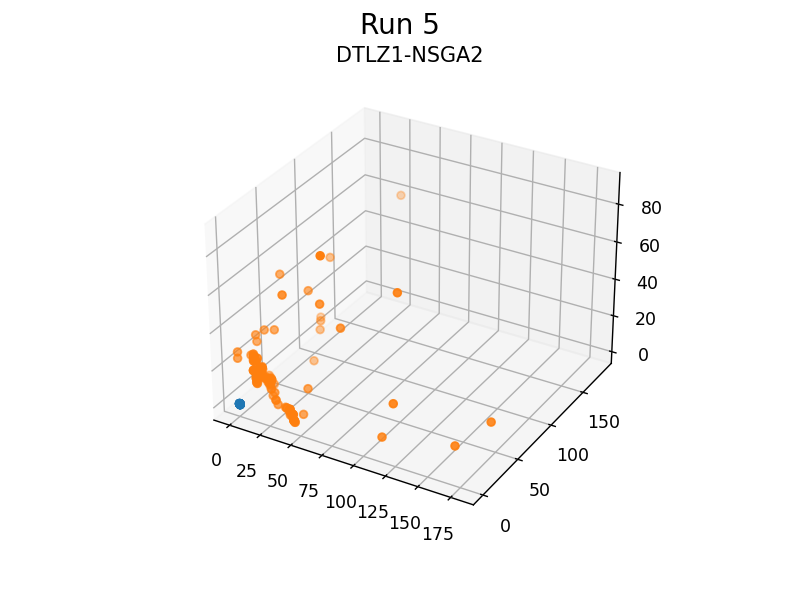

<IPython.core.display.Javascript object>


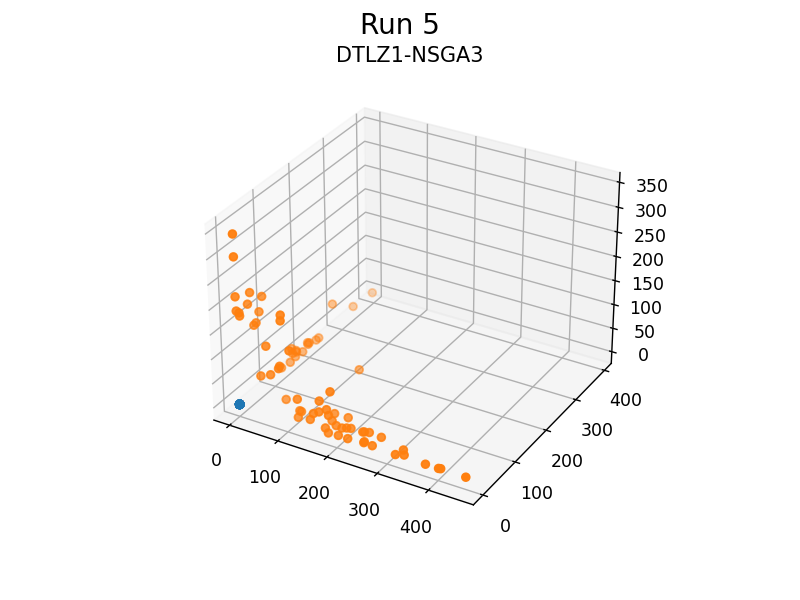

<IPython.core.display.Javascript object>


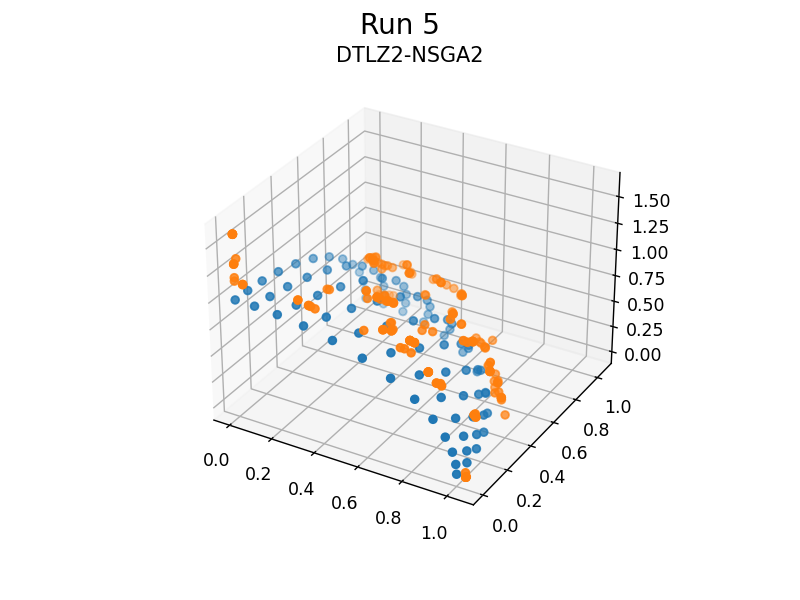

<IPython.core.display.Javascript object>


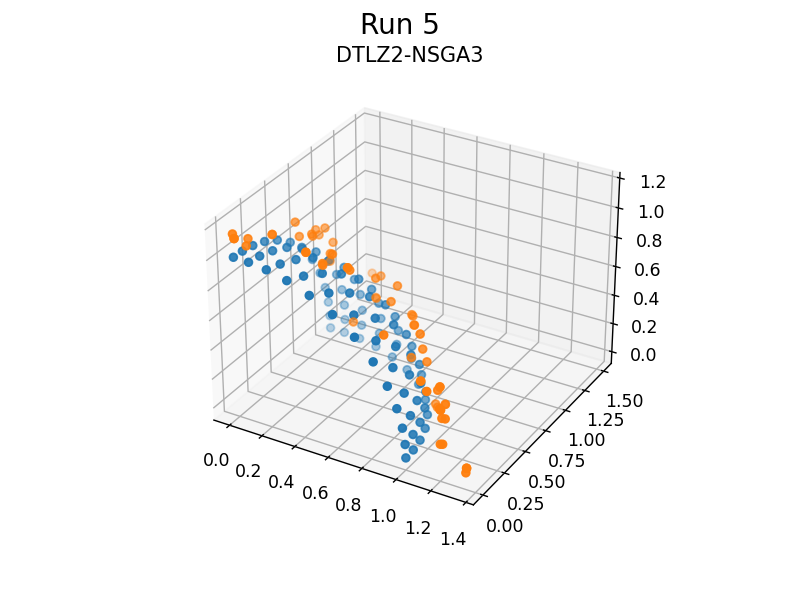

In [126]:
for i, data in enumerate(data_from_json('analytics_1000_250.json')):
    #data.pop("DTLZ1-NSGA2")
    #data.pop("DTLZ2-NSGA2")
    for k, v in data.items():
        mat = np.array(v["evaluations"])
        if "DTLZ1" in k:
            plot_mat_3d([dtlz1_pf, mat], k, f"Run {i + 1}")
        elif "DTLZ2" in k:
            plot_mat_3d([dtlz2_pf, mat], k, f"Run {i + 1}")

## Los mejores resultados de cada algoritmo, en cada problema, en todas las corridas

In [127]:
#Concatenamos los resultados de todas las corridas para cada algoritmo
data_json = data_from_json('analytics_1000_250.json')
best_results = {"DTLZ1-NSGA2" : np.array(data_json[0]["DTLZ1-NSGA2"]["evaluations"]), "DTLZ1-NSGA3" : np.array(data_json[0]["DTLZ1-NSGA3"]["evaluations"]), "DTLZ2-NSGA2" : np.array(data_json[0]["DTLZ2-NSGA2"]["evaluations"]), "DTLZ2-NSGA3" : np.array(data_json[0]["DTLZ2-NSGA3"]["evaluations"])}
for i, data in enumerate(data_json[1:]):
    for k, v in data.items():
        best_results[k] = np.concatenate((best_results[k], np.array(v["evaluations"])), axis = 0)

In [128]:
#Ordenamos respecto a la norma de cada punto
for k in best_results.keys():
    li = list(best_results[k])
    li.sort(key = lambda x : np.linalg.norm(x, 2))
    #Extraemos el percentil 80 de cada valor del diccionario
    n = len(li)
    p = math.floor(n*0.2)
    best_results[k] = np.array(li)[0 : p + 1,:]

<IPython.core.display.Javascript object>


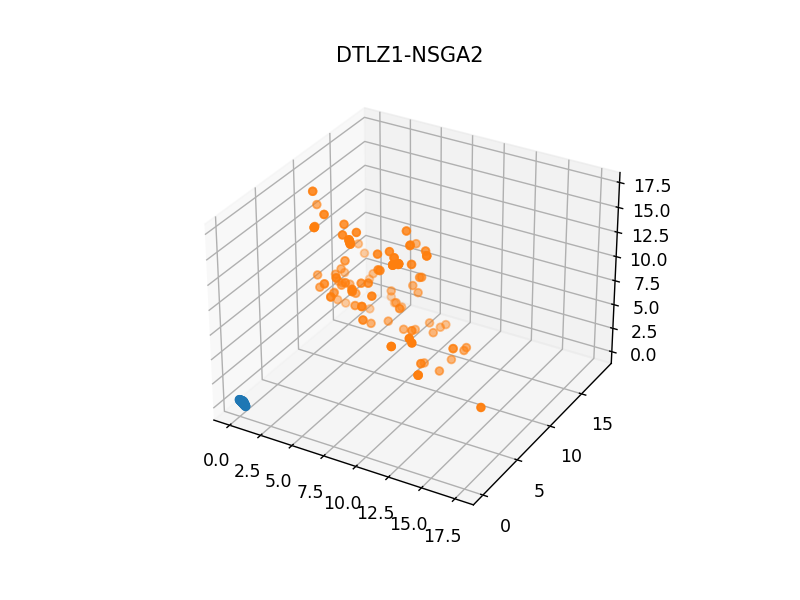

<IPython.core.display.Javascript object>


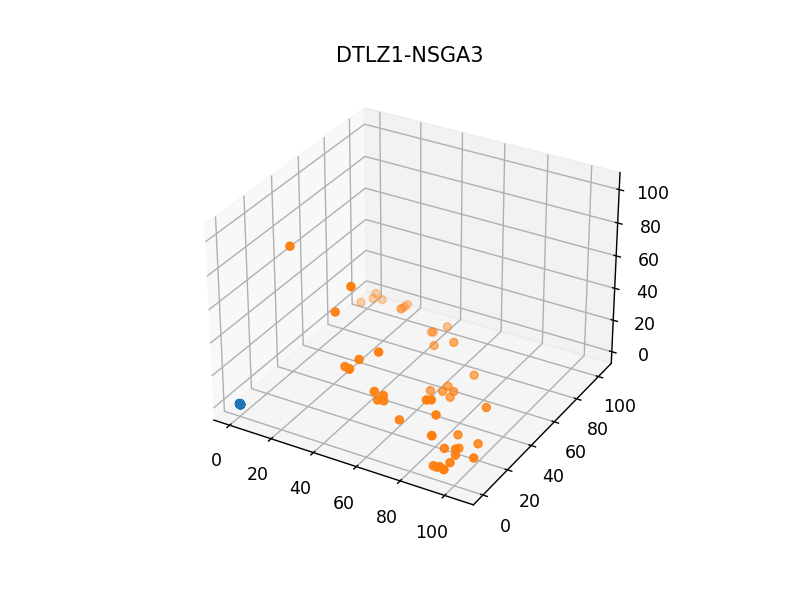

<IPython.core.display.Javascript object>


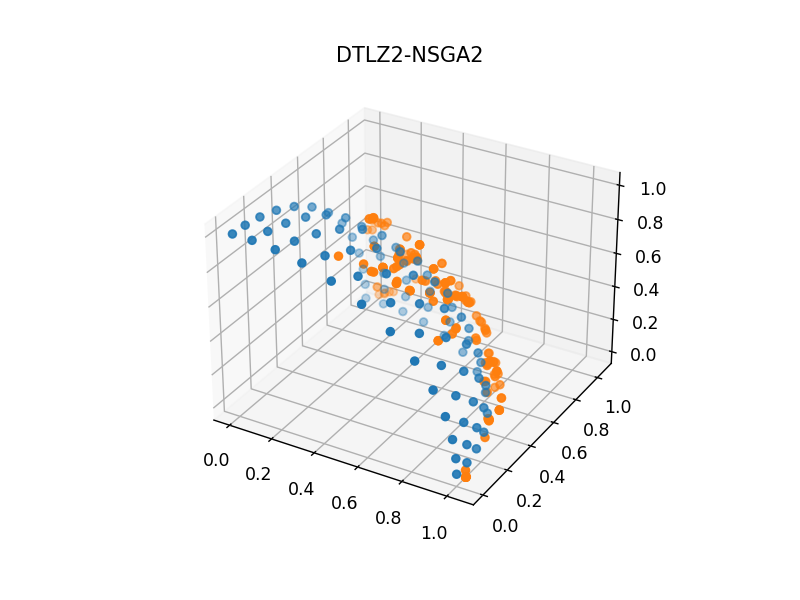

<IPython.core.display.Javascript object>


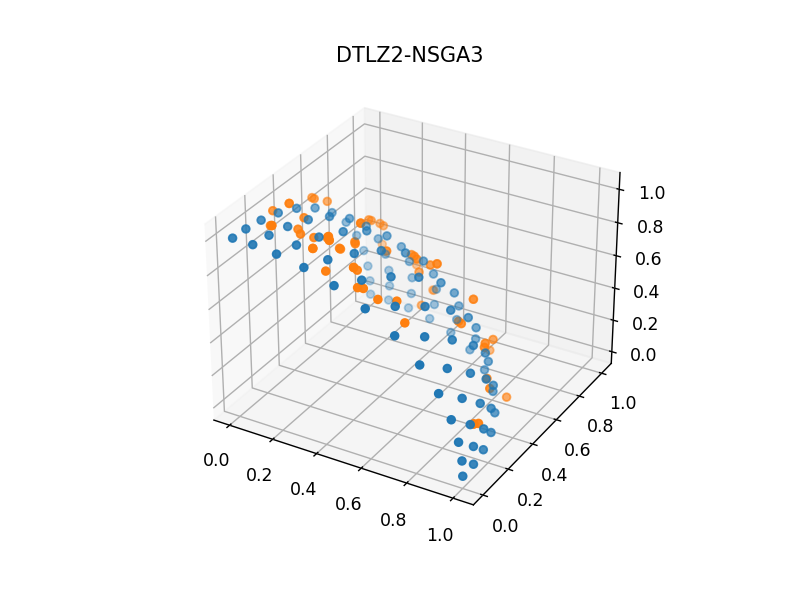

In [129]:
for k, v in best_results.items():
    if "DTLZ1" in k:
        plot_mat_3d([dtlz1_pf, v], k, "")
    elif "DTLZ2" in k:
        plot_mat_3d([dtlz2_pf, v], k, "")

## Implementación del método de sumas ponderadas.
Para esta implementación lo que se hizo fue tomar la del gradiente descendente de la tarea anterior y modificarla mínimamente para que las funciones correspondientes a los gradientes y a las funciones en sí recibieran un parámetro de pesos $\vec{w}$.

De ahí únicamente restaba redefinir las funciones multiobjetivo DTLZ1 y DTLZ2 como un par de nuevas funciones monobjetivo correspondientes a la combinación lineal de dicho par de funciones y $\vec{w}$.
$$F_{w}(\vec{x}) = \mathbf{w}^{T}\mathbf{F}(\vec{x})$$
Para obtener el gradiente de una función como esta es posible reexpresarlo en terminos de la matriz Jacobiana de la función vectorial de variable vectorial $\mathbf{F}(\vec{x})$

$$J(\mathbf{F}) = \frac{\partial \mathbf{F}}{\partial \vec{x}} = \begin{pmatrix}
\frac{\partial f_1}{\partial x_1} & \frac{\partial f_1}{\partial x_2} & ... & \frac{\partial f_1}{\partial x_j} & ... & \frac{\partial f_1}{\partial x_{M}}\\
... & ... & ... & ... & ... & ... \\
\frac{\partial f_i}{\partial x_1} & \frac{\partial f_i}{\partial x_2} & ... & \frac{\partial f_i}{\partial x_j} & ... & \frac{\partial f_i}{\partial x_{M}}\\
... & ... & ... & ... & ... & ... \\
\frac{\partial f_{K}}{\partial x_1} & \frac{\partial f_{K}}{\partial x_2} & ... & \frac{\partial f_{K}}{\partial x_j} & ... & \frac{\partial f_{K}}{\partial x_{M}}\\
\end{pmatrix}$$


$$\nabla F_{w}(\vec{x}) = w_1J_1(\mathbf{F}) + w_2J_2(\mathbf{F}) + ... + w_kJ_K(\mathbf{F})$$


Con dicho gradiente y $F_{w}(\vec{x})$ se aplica el algoritmo del gradiente descendente para optimizar la función objetivo multiobjetivo $\mathbf{F}(\vec{x})$



## Parámetros
Se probó el método sobre 20 vectores distintos $\vec{w}$. Para cada vector distinto a su vez se realizaron 100 ejecuciones del método con distintos vectores iniciales $\vec{x}_0$ para lograr obtener distintas soluciones en el frente de pareto.
Para todas las ejecuciones se manejó una $\alpha_0 = 1$ y un máximo de 1000 iteraciones.

Los 20 vectores distintos fueron los siguientes:


In [130]:
ws

[[0.1666, 0.6666, 0.1666],
 [0.8, 0.1, 0.1],
 [0.1, 0.8, 0.1],
 [0.1, 0.1, 0.8],
 [0.2, 0.0, 0.8],
 [0.2, 0.8, 0.0],
 [0.8, 0.2, 0.0],
 [0.333, 0.333, 0.333],
 [0.25, 0.25, 0.5],
 [0.25, 0.5, 0.25],
 [0.5, 0.25, 0.25],
 [0.5, 0.5, 0.0],
 [0, 0.5, 0.5],
 [0.5, 0, 0.5],
 [0.2, 0.2, 0.6],
 [0.2, 0.6, 0.2],
 [0.6, 0.2, 0.2],
 [0.4, 0.3, 0.3],
 [0.3, 0.4, 0.3],
 [0.3, 0.3, 0.4]]

### Resultados con distintas $\vec{w}$

<IPython.core.display.Javascript object>


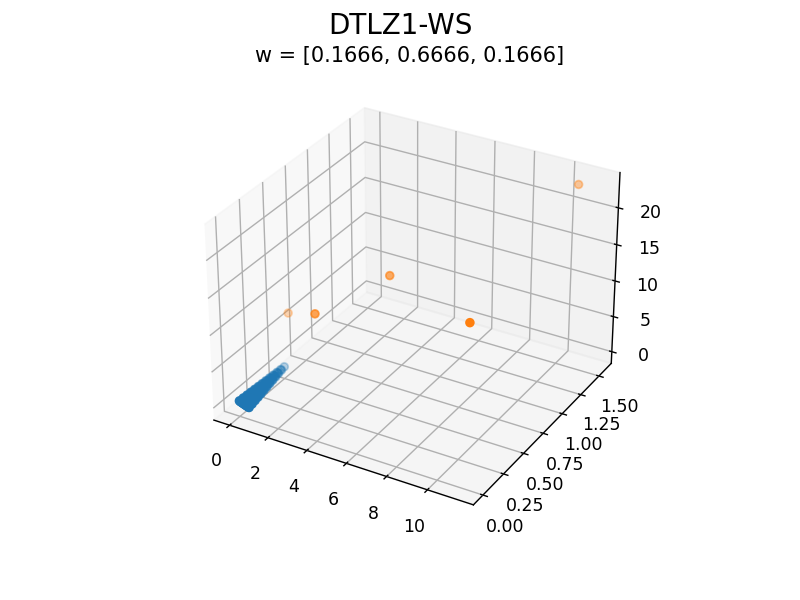

<IPython.core.display.Javascript object>


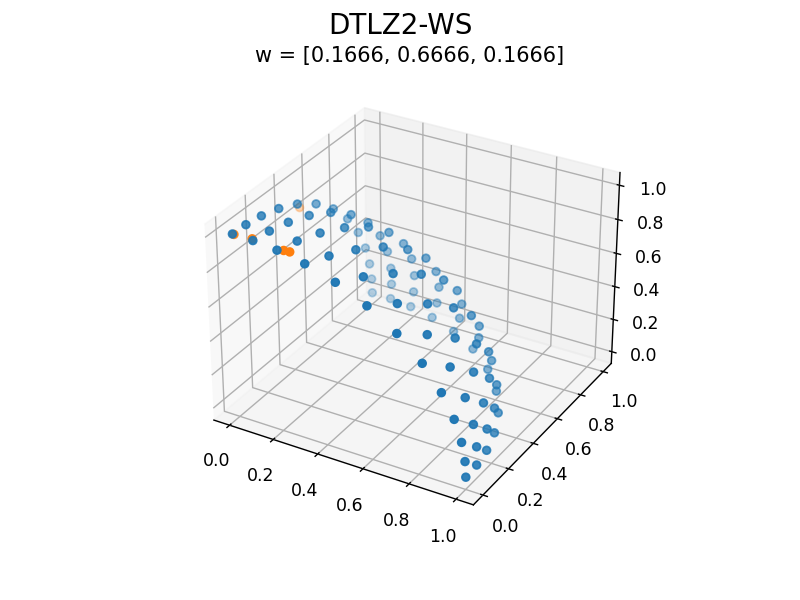

<IPython.core.display.Javascript object>


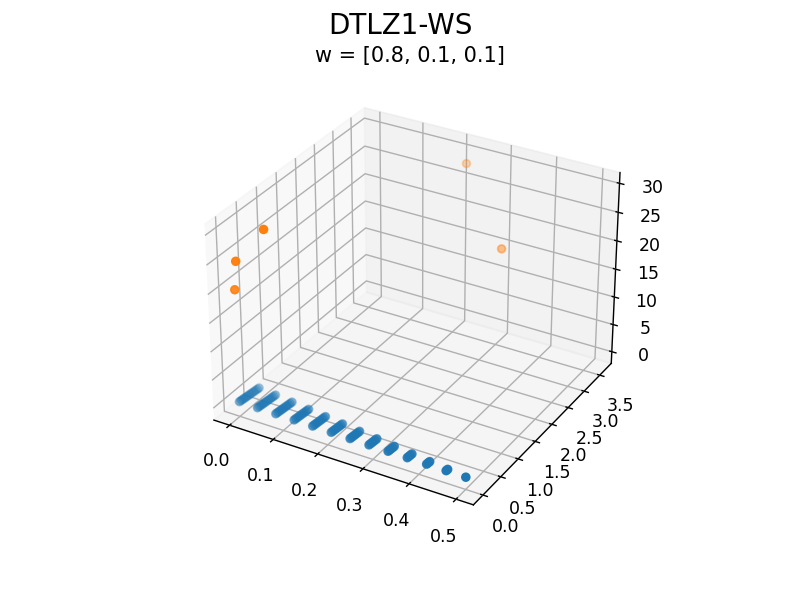

<IPython.core.display.Javascript object>


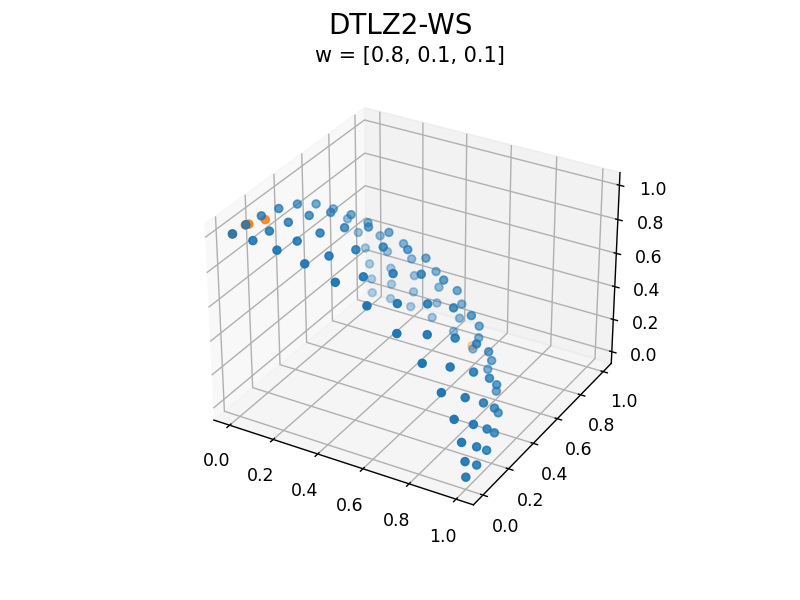

<IPython.core.display.Javascript object>


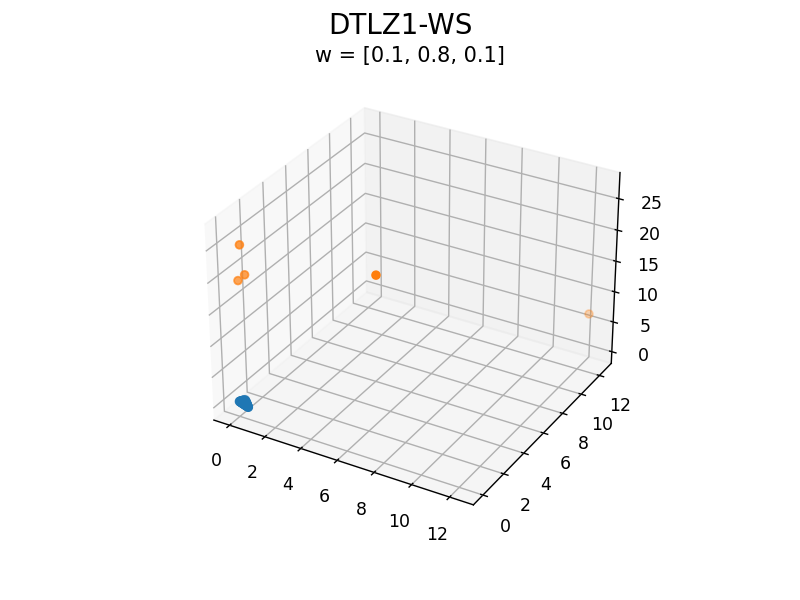

<IPython.core.display.Javascript object>


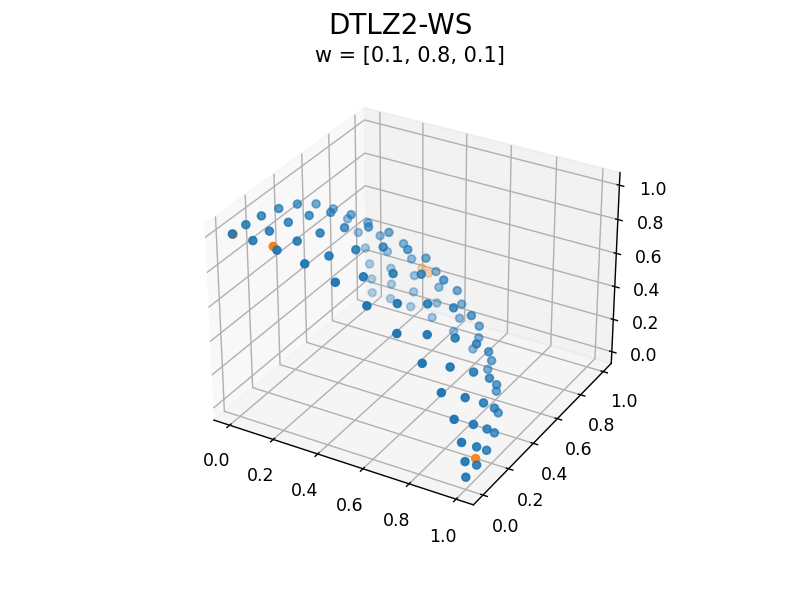

<IPython.core.display.Javascript object>


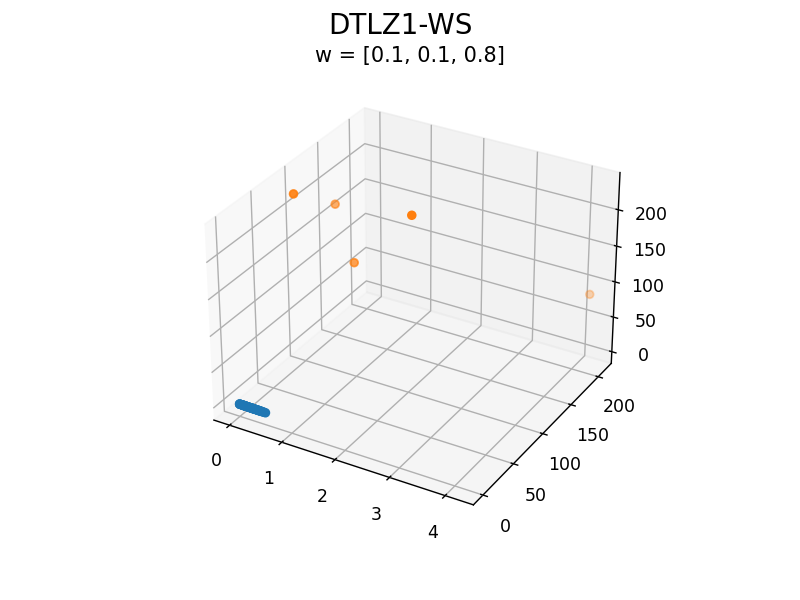

<IPython.core.display.Javascript object>


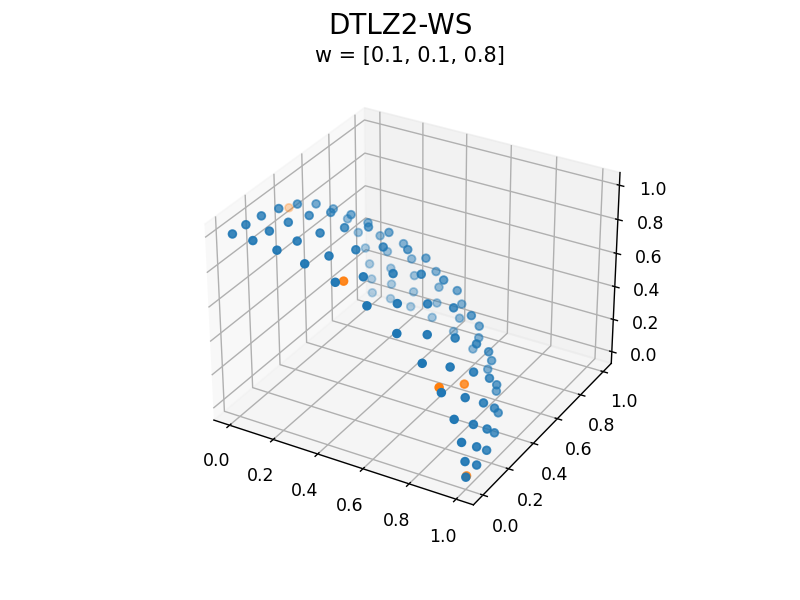

<IPython.core.display.Javascript object>


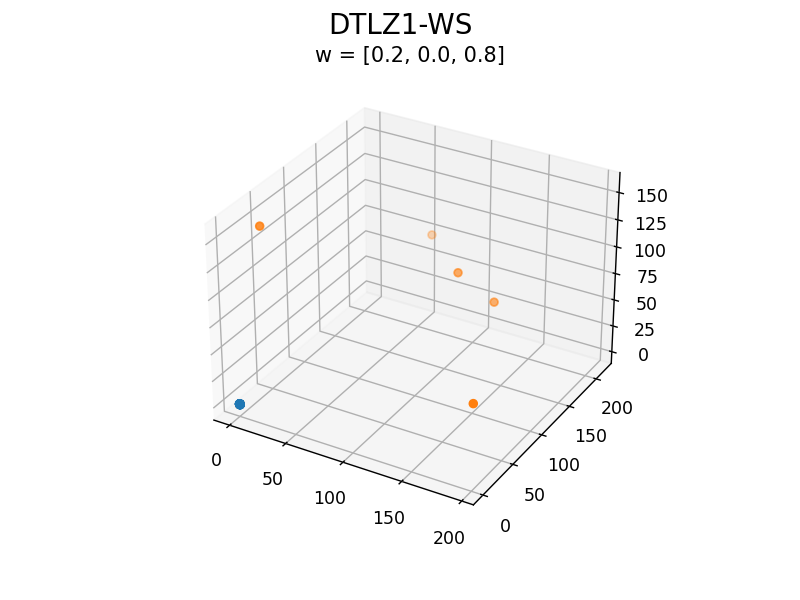

<IPython.core.display.Javascript object>


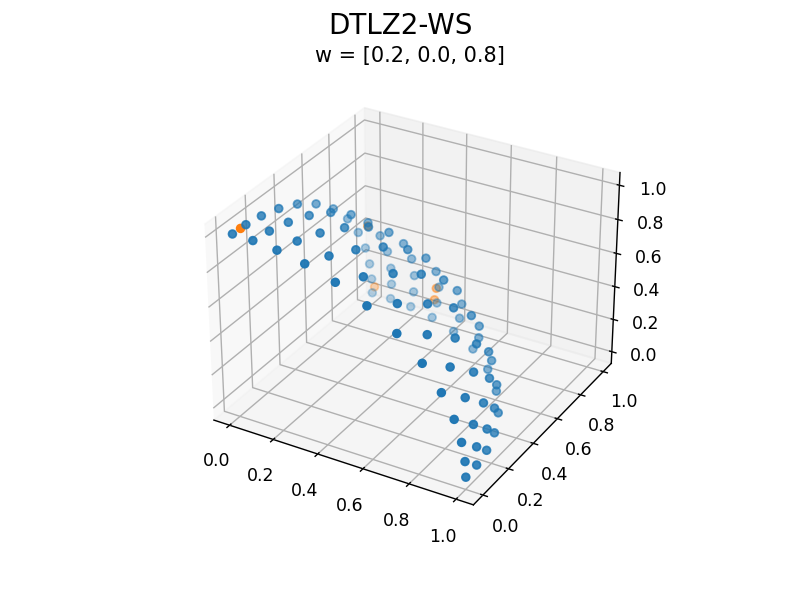

<IPython.core.display.Javascript object>


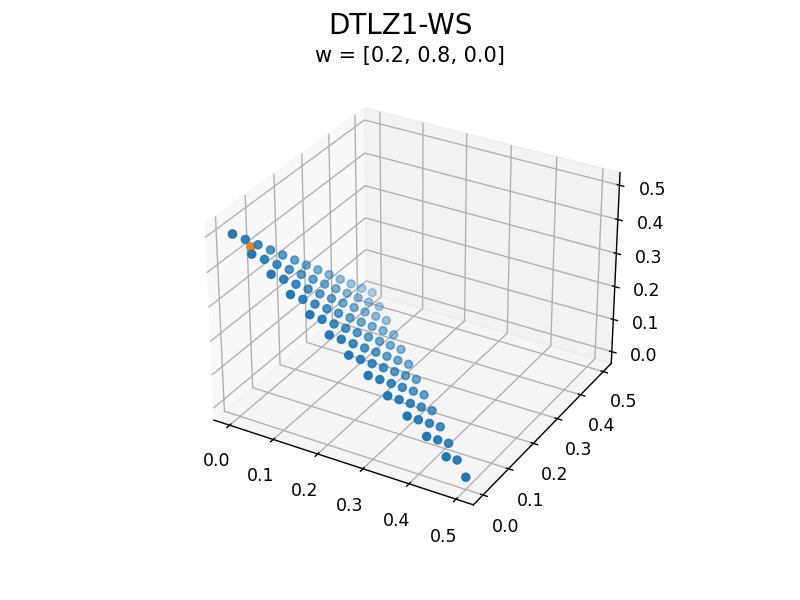

<IPython.core.display.Javascript object>


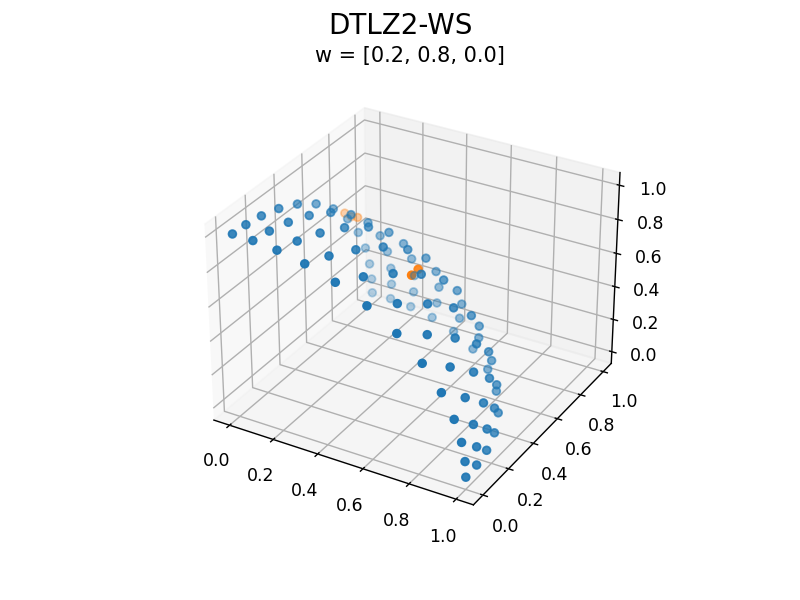

<IPython.core.display.Javascript object>


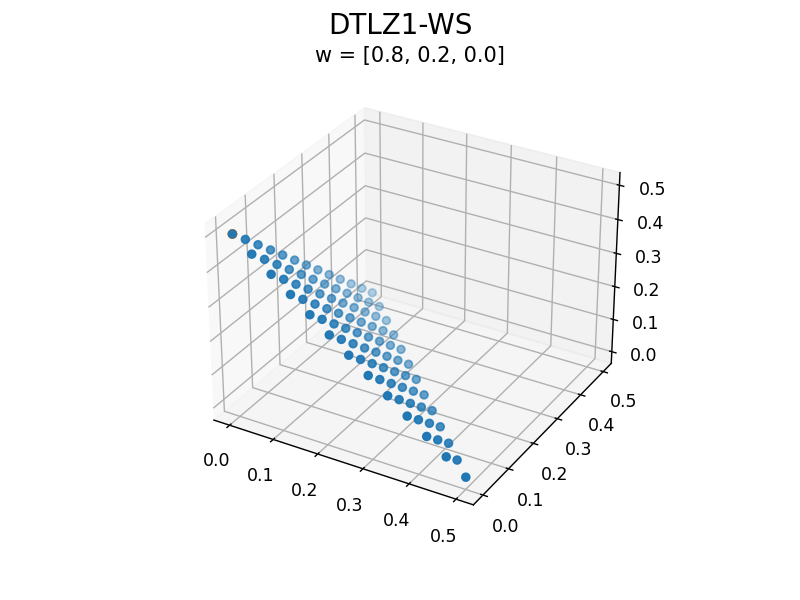

<IPython.core.display.Javascript object>


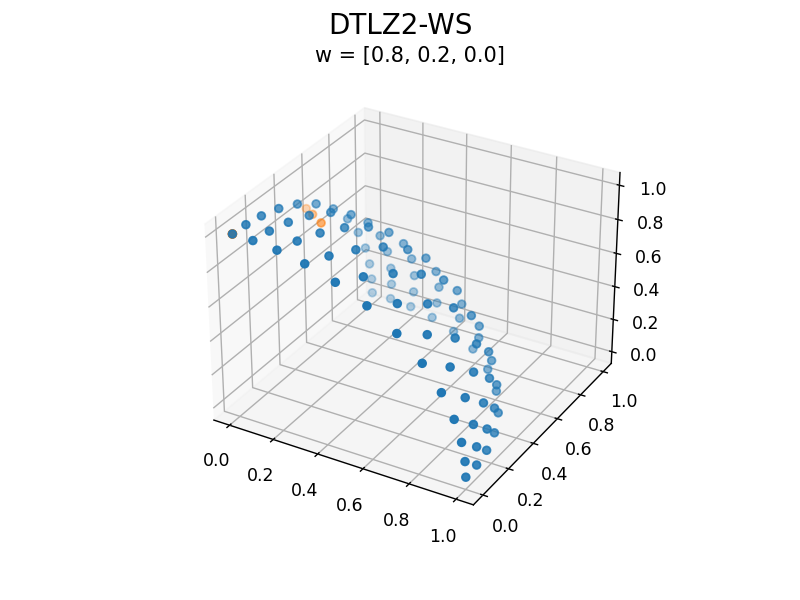

<IPython.core.display.Javascript object>


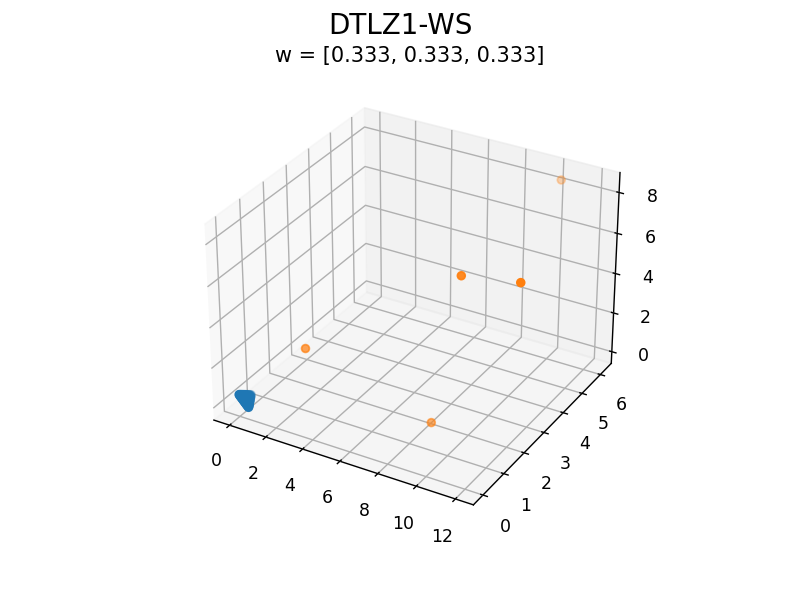

<IPython.core.display.Javascript object>


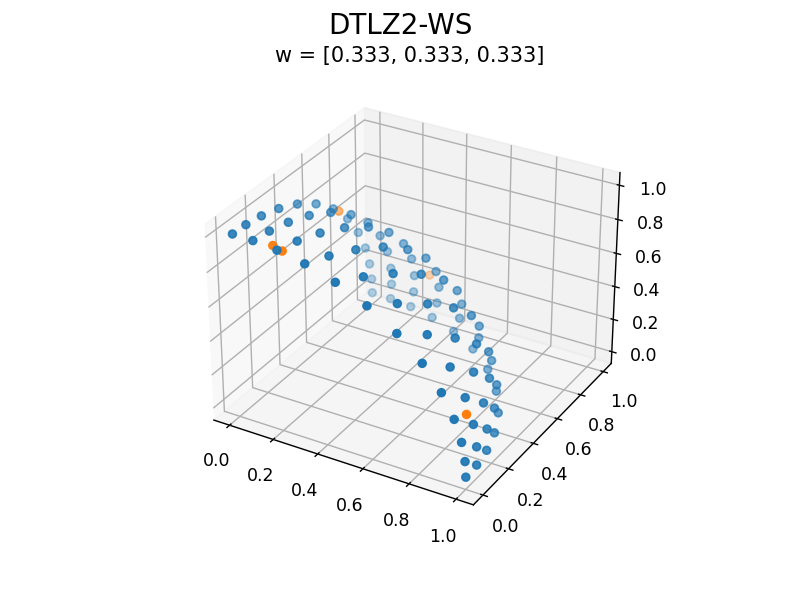

<IPython.core.display.Javascript object>


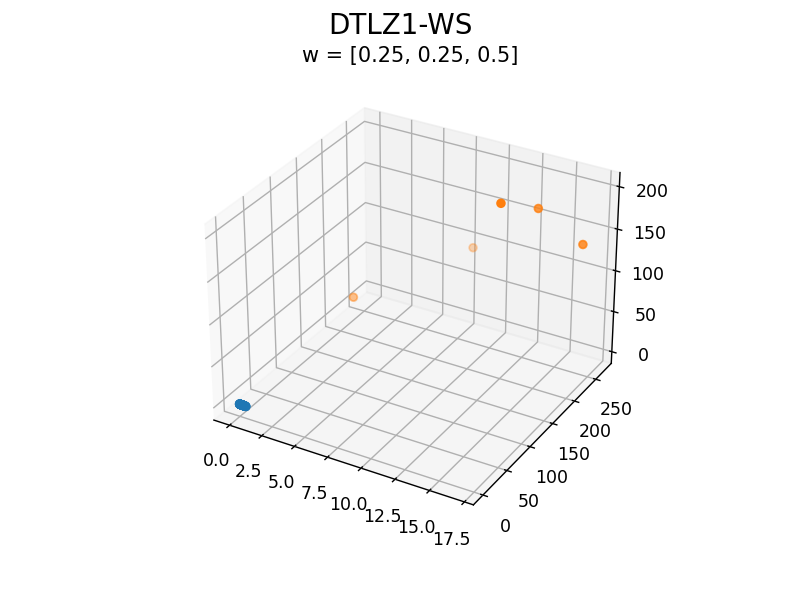

<IPython.core.display.Javascript object>


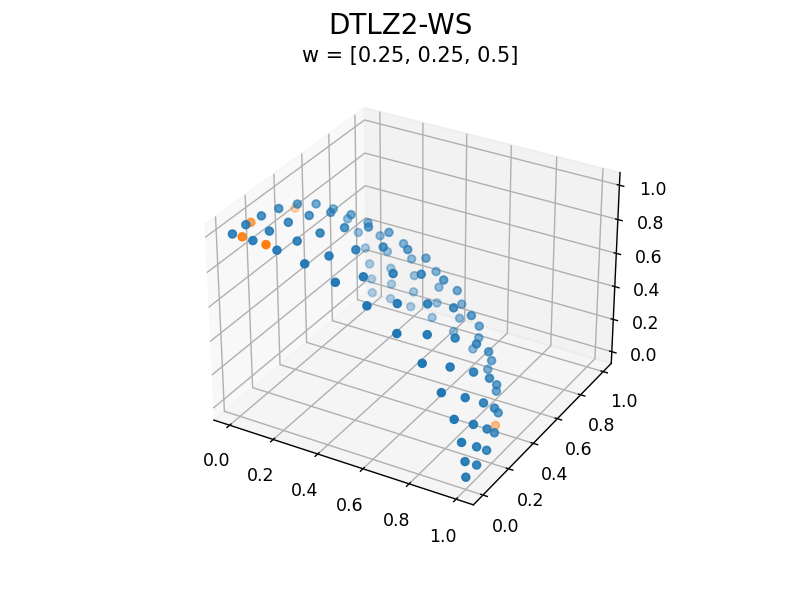

<IPython.core.display.Javascript object>


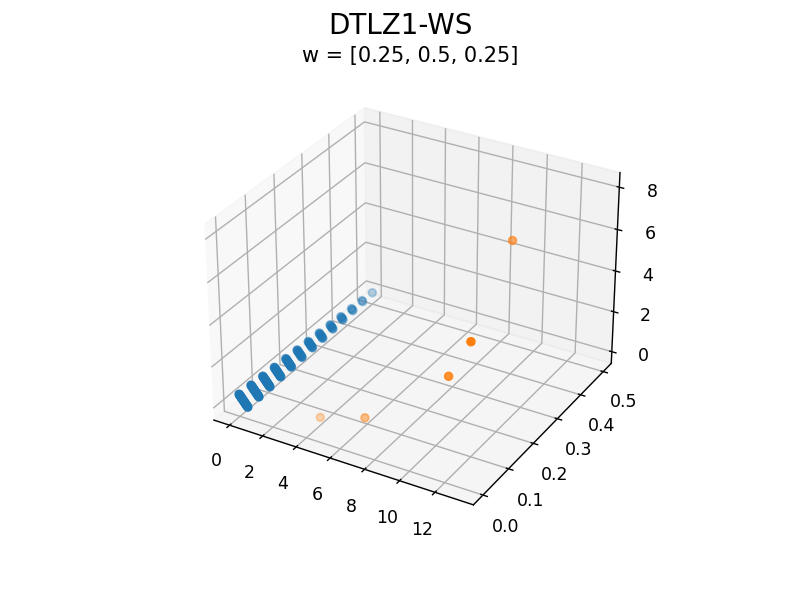

<IPython.core.display.Javascript object>


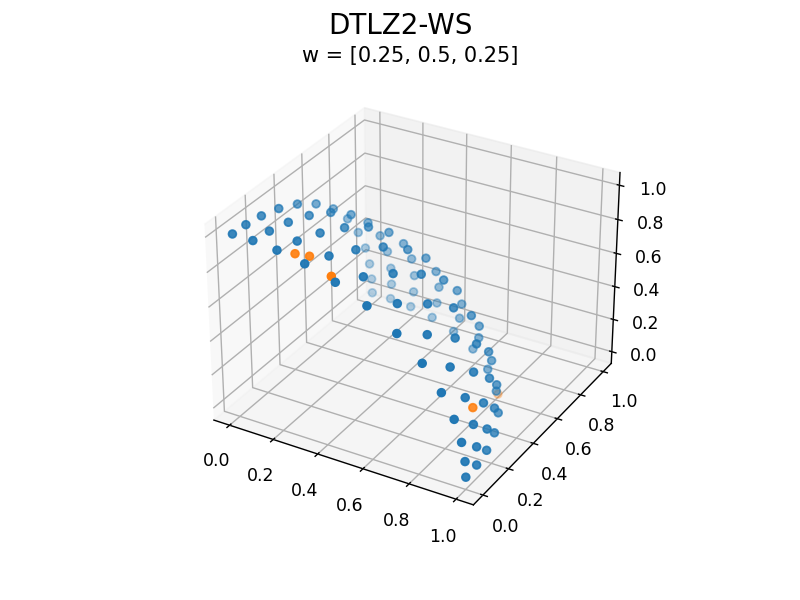

<IPython.core.display.Javascript object>


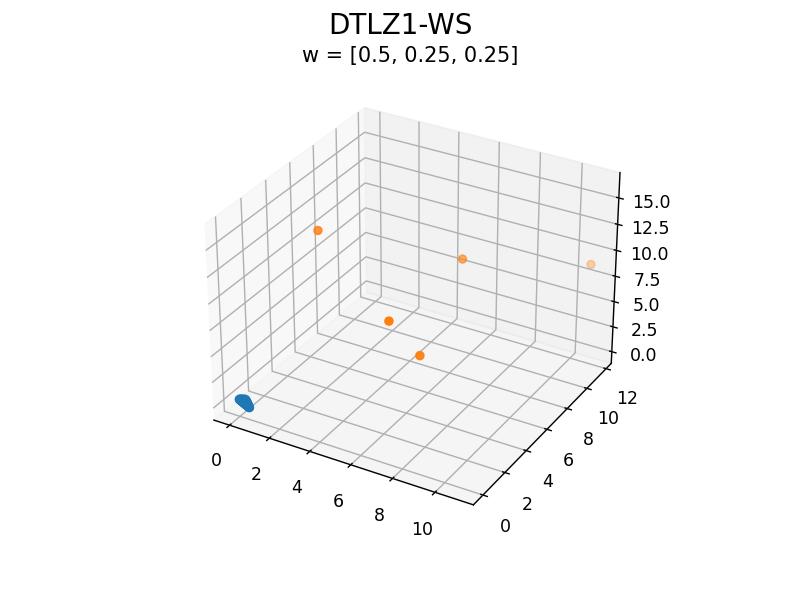

<IPython.core.display.Javascript object>


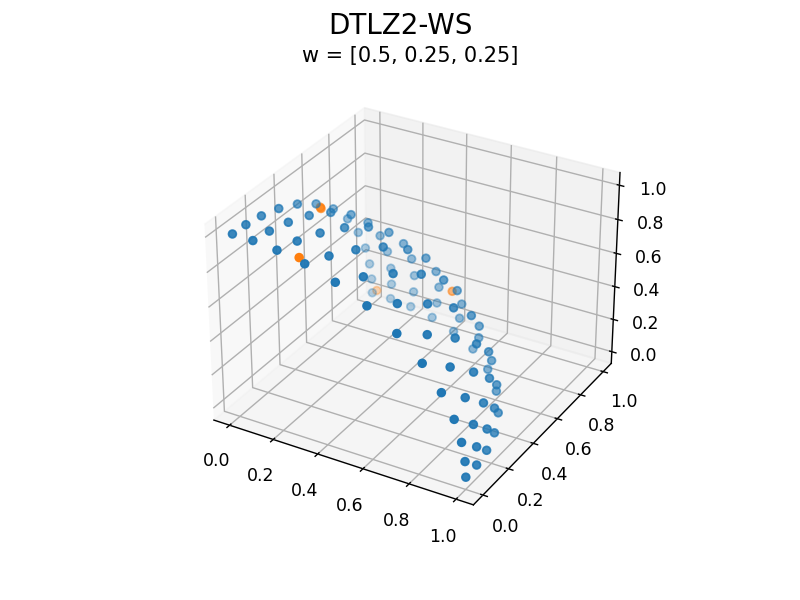

<IPython.core.display.Javascript object>


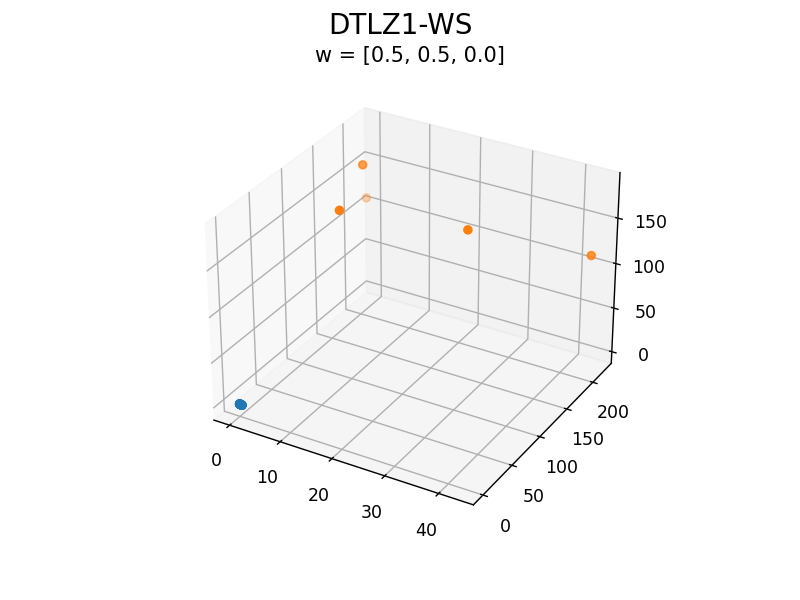

<IPython.core.display.Javascript object>


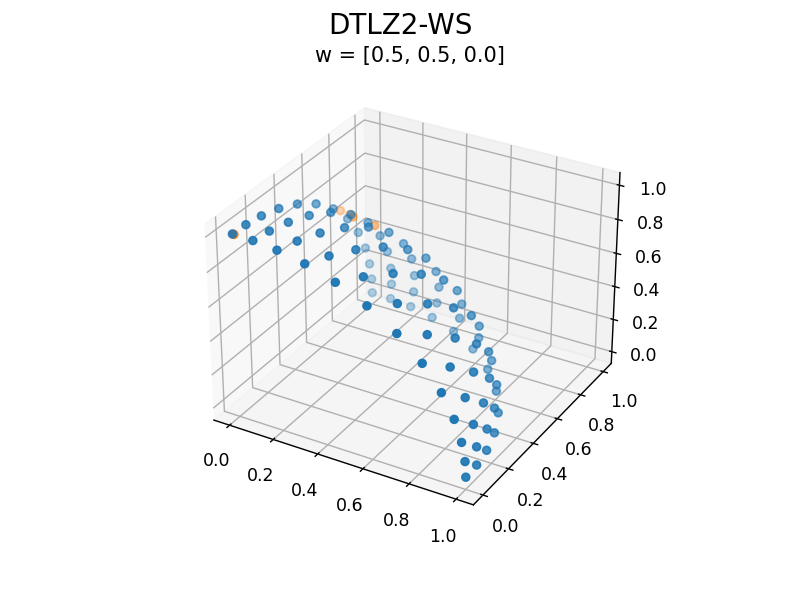

<IPython.core.display.Javascript object>


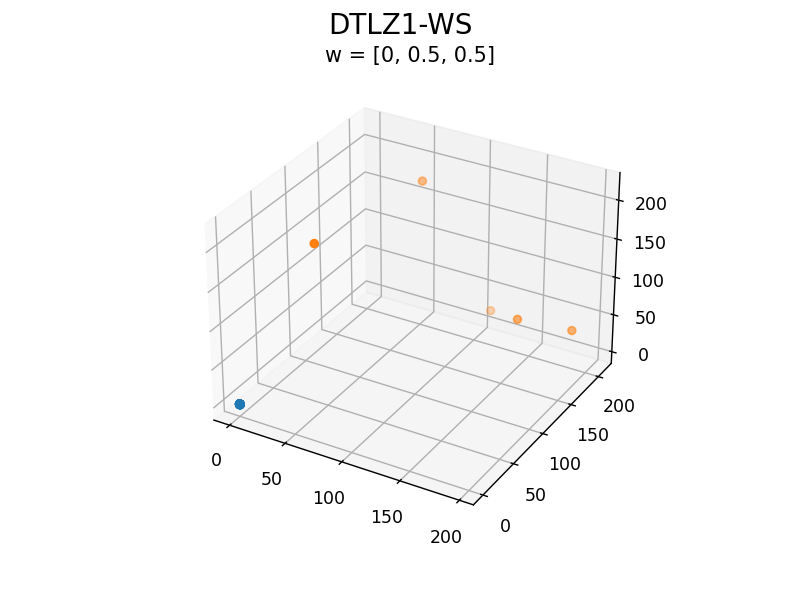

<IPython.core.display.Javascript object>


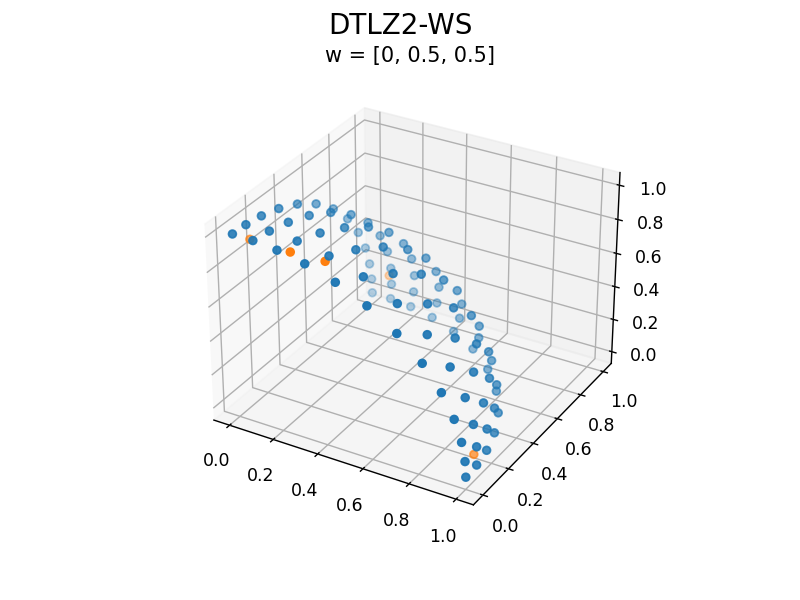

<IPython.core.display.Javascript object>


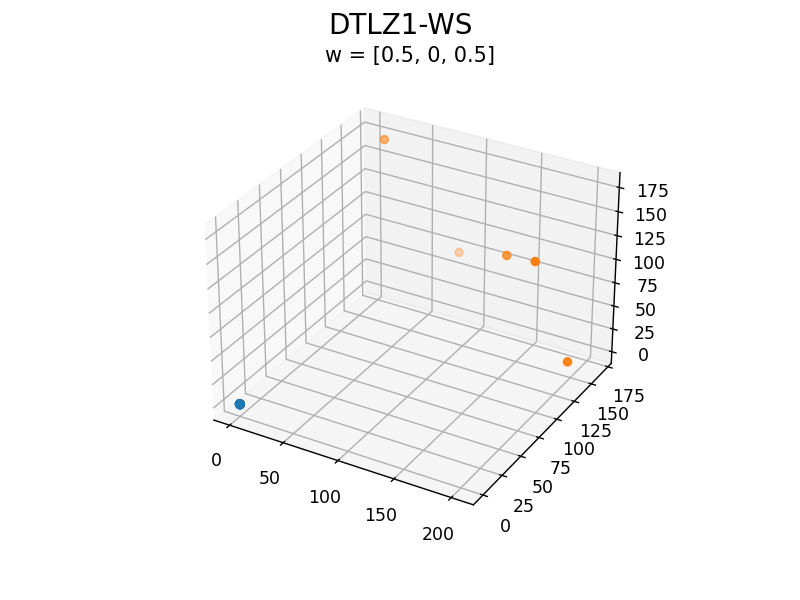

<IPython.core.display.Javascript object>


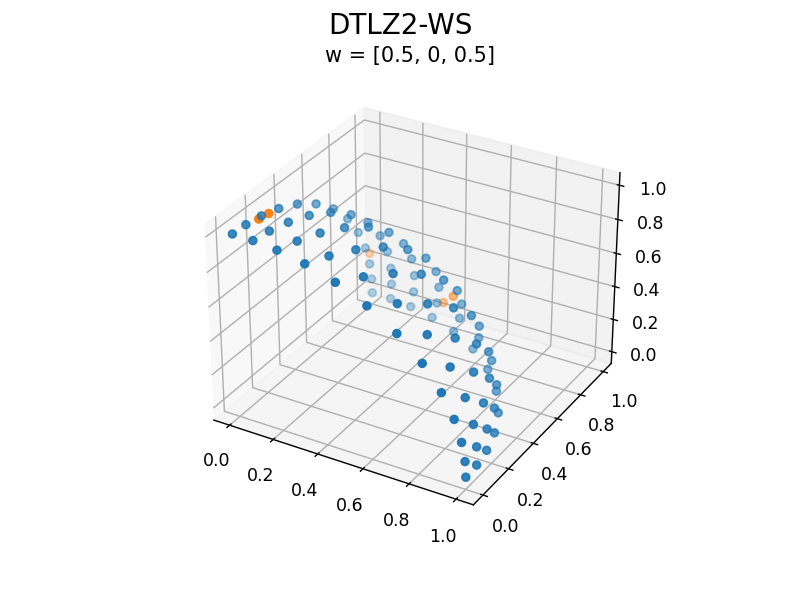

<IPython.core.display.Javascript object>


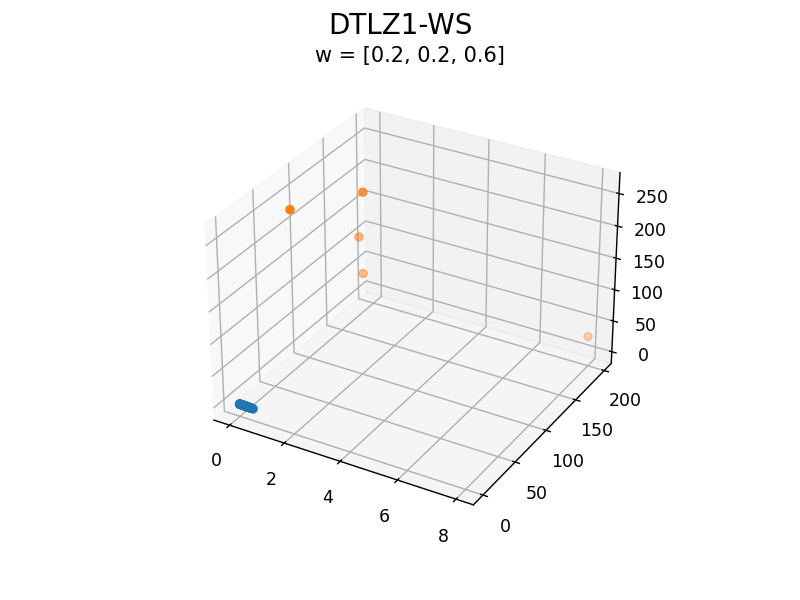

<IPython.core.display.Javascript object>


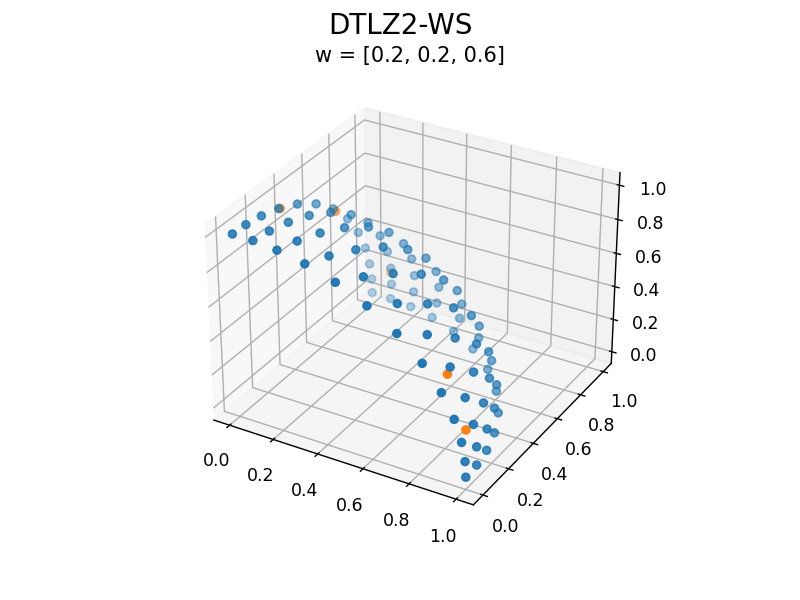

<IPython.core.display.Javascript object>


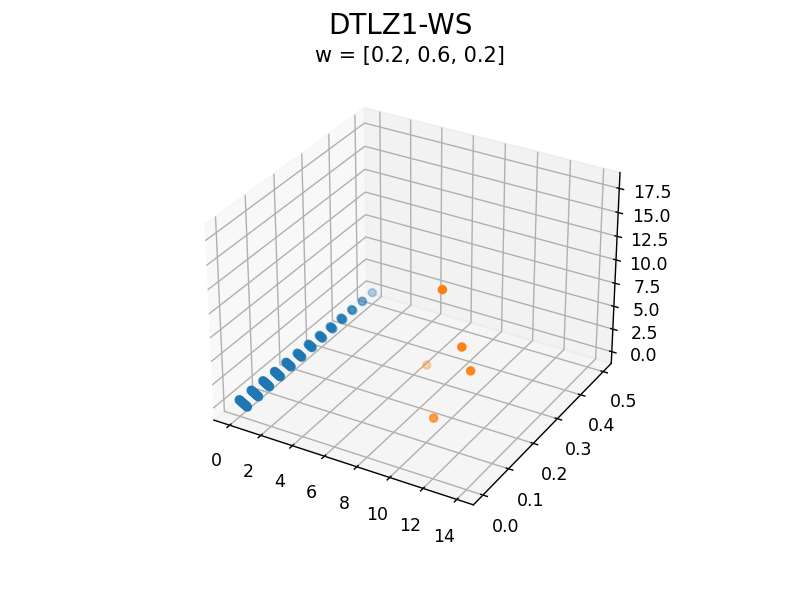

<IPython.core.display.Javascript object>


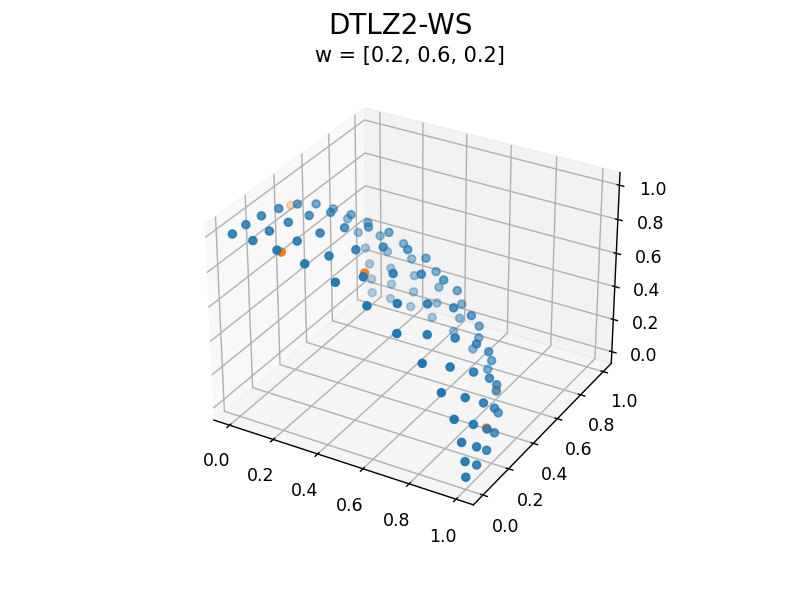

<IPython.core.display.Javascript object>


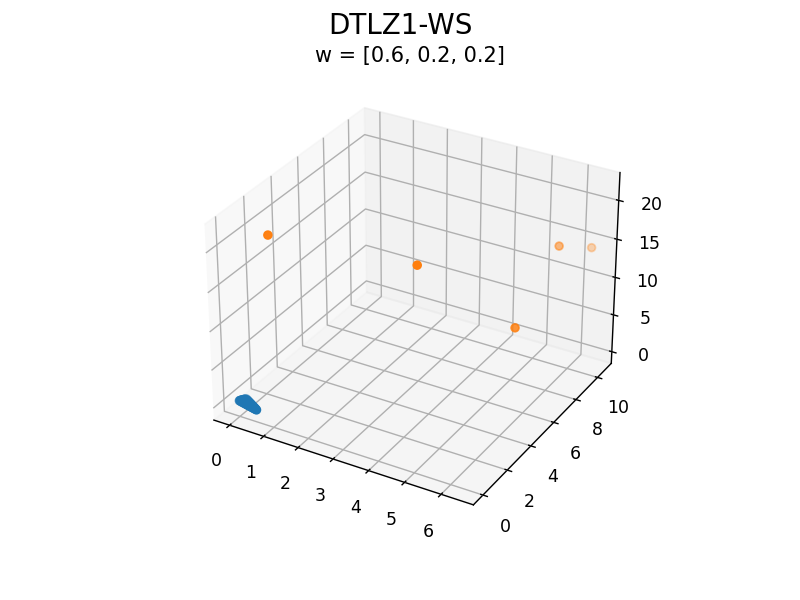

<IPython.core.display.Javascript object>


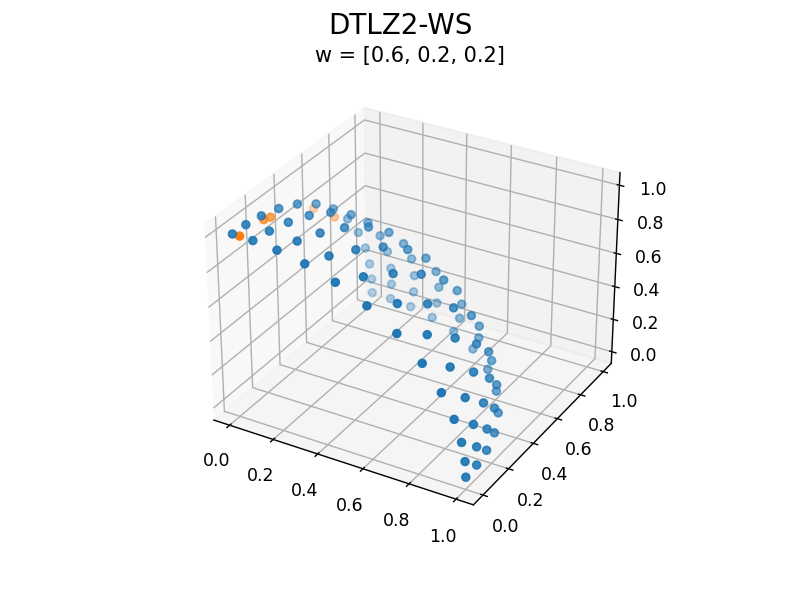

<IPython.core.display.Javascript object>


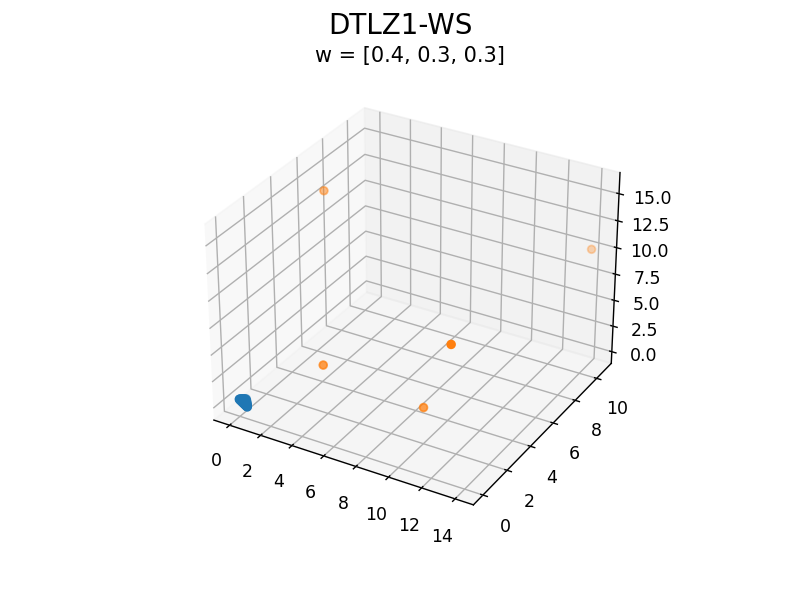

<IPython.core.display.Javascript object>


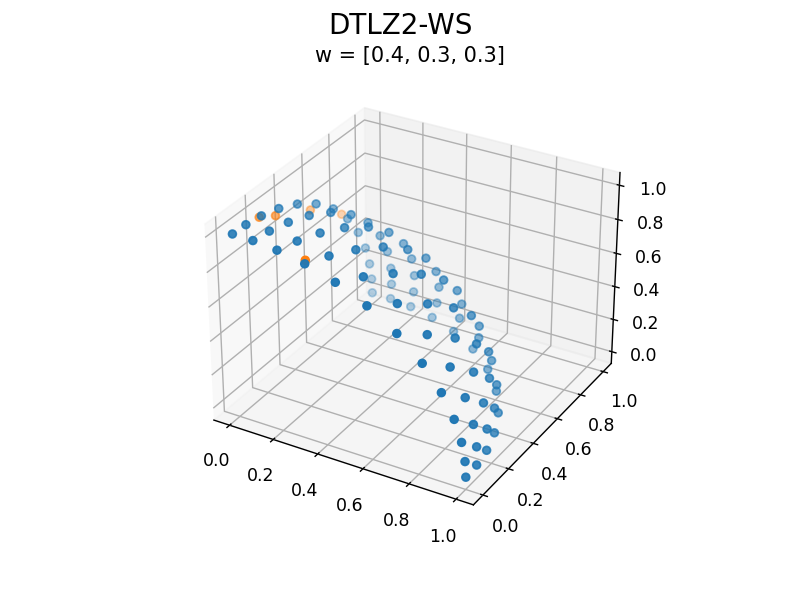

<IPython.core.display.Javascript object>


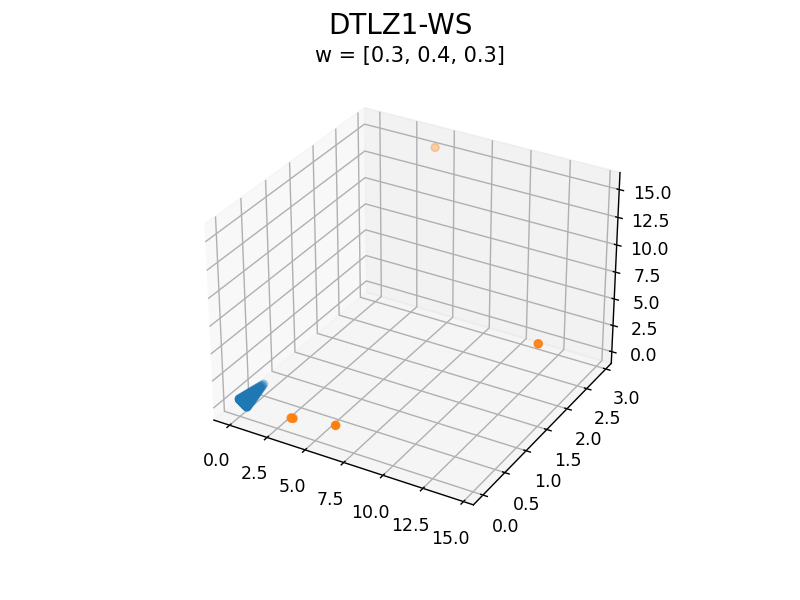

<IPython.core.display.Javascript object>


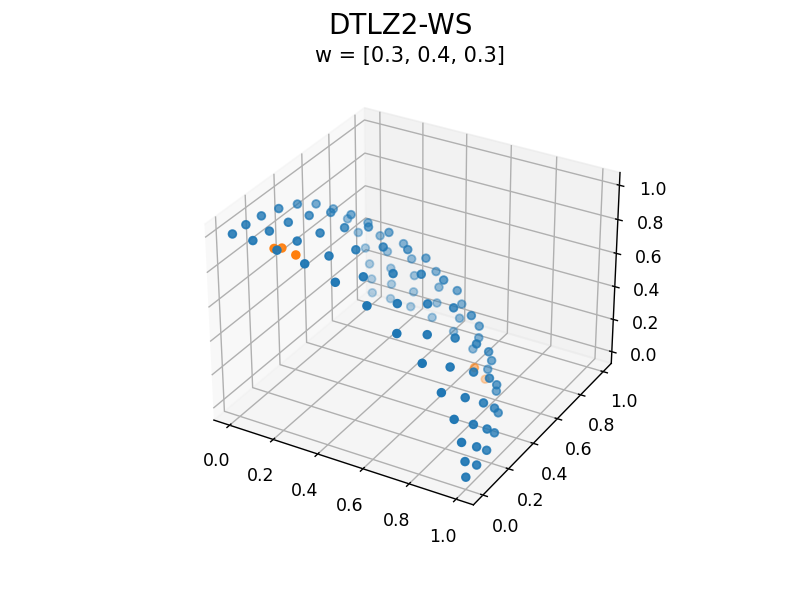

<IPython.core.display.Javascript object>


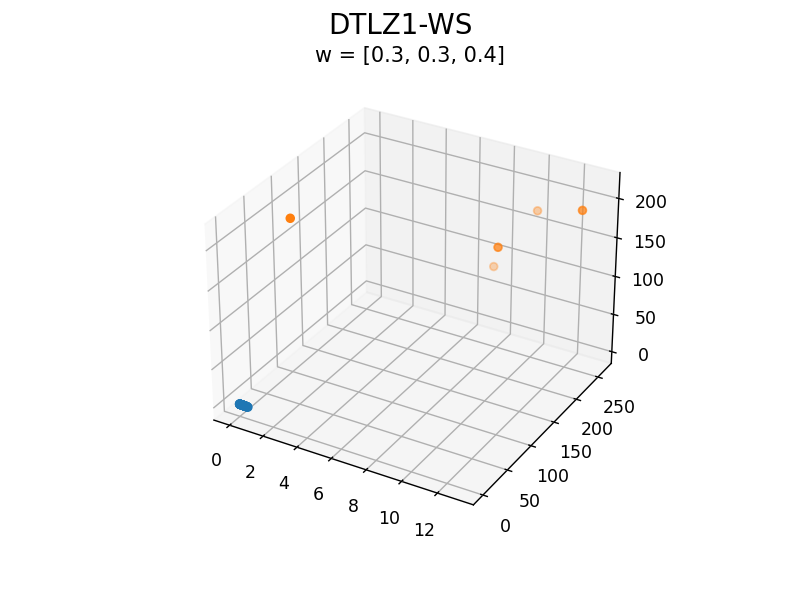

<IPython.core.display.Javascript object>


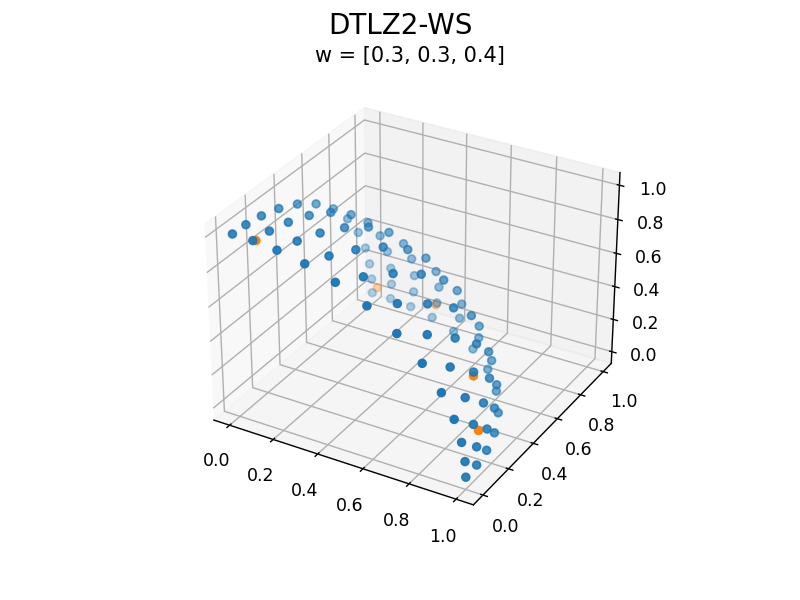

In [131]:
data_json = data_from_json('ws-analytics2.json')[0]

for i in range(len(ws)):
    #data.pop("DTLZ1-NSGA2")
    #data.pop("DTLZ2-NSGA2")
    li_dtlz1 = list(filter(lambda x : np.all(np.array(x) > 0.) , data_json["DTLZ1-WS"]["evaluations"][i]))
    li_dtlz2 = list(filter(lambda x : np.all(np.array(x) > 0.), data_json["DTLZ2-WS"]["evaluations"][i]))
    if len(li_dtlz1) > 0:
        li_dtlz1.sort(key = lambda x : np.linalg.norm(np.array(x), 2))
        mat_dtlz1 = np.array(li_dtlz1[0:5])
        plot_mat_3d([dtlz1_pf, mat_dtlz1], "w = " + str(ws[i]), f"DTLZ1-WS")
    if len(li_dtlz2) > 0:
        li_dtlz2.sort(key = lambda x : np.linalg.norm(np.array(x), 2))            
        mat_dtlz2 = np.array(li_dtlz2[0:5])
        plot_mat_3d([dtlz2_pf, mat_dtlz2], "w = " + str(ws[i]), f"DTLZ2-WS")
